### pow = 0인 구간 : 0-4, 21-23시
### 유효한 구간 : 5-20시

# OBS_ASOS_TIM_*.csv

In [2]:
# DATA 준비
# 20201008
#---- to do list -----
# err_data_list 파일자동화

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os

from tensorflow.python.keras.optimizer_v2.rmsprop import RMSProp
from math import sqrt
from numpy import concatenate
from matplotlib import pyplot
from pandas import read_csv, DataFrame, concat
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import Dense, RepeatVector, LSTM, Input, TimeDistributed, Activation, Dropout
from keras.optimizers import SGD
np.set_printoptions(suppress=True)

#pow 낮값만 추출 test
#pow = 0인 구간 : 0~4, 21-23시
powhr_start = 5
powhr_end   = 20

shift_days  = 3
hoursteps   = powhr_end-powhr_start+1 #(16)
timesteps   = shift_days*hoursteps #hours step

data_dim    = 15
out_dim     = 1

n_model    = 10

season_mod = 'winter_f9'
date_start = '10190901'
date_end   = '30191201'

err_date_list = ['20190912',
                    '20191122',
                    '20191130',
                    '20191217',
                    '20200501',
                    '20200502',
                    '20191028',
                    '20191107',
                    '20191108',
                    '20191109',
                    '20191110',
                    '20191111',
                    '20191112',
                    '20200214',
                    '20200307',
                    '20200308',
                    '20200309',
                    '20200310',
                    '20200328',
                    '20200329',
                    '20200625',
                    '20200809']

Using TensorFlow backend.


# weather, pow

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import fnmatch
from pandas import read_csv

#############################################
# 태양광 전력
#############################################
def get_pow():

    # pow 파일 load
    dir_path    = "C:/Users/VISLAB_PHY/Desktop/WORKSPACE/Origin/data/pow_24/UR00000126_csv"
    file_list   = os.listdir(dir_path)
    print(len(file_list))
    hrPow  = []    

    # pow측정값 에러가 큰 일자 제거
    for filename in file_list:
        if (filename[:-4] not in err_date_list):
            if ((filename[:-4]>=date_start) & (filename<date_end)):
                filedata = pd.read_csv(dir_path+'/'+filename).values[:,0]
                hrPow.append(filedata)
                
    #낮시간 추출 (5~20시)
    pow_dataset = pd.DataFrame(hrPow)
    pow_dataset =pow_dataset.iloc[:,powhr_start:powhr_end+1]
    pow_dataset.to_csv("C:/Users/VISLAB_PHY/Desktop/WORKSPACE/Origin/data/pow_hr.csv",mode='w',index=False)

    # 결측값 보간, reshape
    pow_dataset = pow_dataset.interpolate(method='linear')
    pow_dataset = pow_dataset.values.reshape(-1,1)
    pow_dataset = pd.DataFrame(pow_dataset)
    pow_dataset.columns = ['pow']

    # save csv file
    pow_dataset.to_csv("C:/Users/VISLAB_PHY/Desktop/WORKSPACE/Origin/data/pow.csv",mode='w',index=False)

    data_pow  = pow_dataset.values
    #data_pow  = data_pow[:-clip]

    # scale
    sc_pow = MinMaxScaler(feature_range = (0, 1))
    scaled_pow = sc_pow.fit_transform(data_pow)

    return np.array(scaled_pow), sc_pow

#############################################
# 종관기상관측
#############################################
def get_weather():
    # pow 파일 load
    dir_path    = "C:/Users/VISLAB_PHY/Desktop/WORKSPACE/Origin/DATA"
    file_list   = os.listdir(dir_path)
    print(len(file_list))
    for filename in os.listdir(dir_path):
        if fnmatch.fnmatch(filename, 'OBS_ASOS_TIM_*.csv'):
            print(filename)

            # load csv data
            dataset = read_csv(dir_path+'/'+filename, encoding='CP949')
            dataset.drop(['지점','지점명'], axis=1, inplace=True)
            dataset.drop(['기온 QC플래그','강수량 QC플래그','풍속 QC플래그','풍향 QC플래그','습도 QC플래그'], axis=1, inplace=True)
            dataset.drop(['현지기압 QC플래그','해면기압 QC플래그','일조 QC플래그','지면온도 QC플래그'], axis=1, inplace=True)
            dataset.drop(['5cm 지중온도(°C)','10cm 지중온도(°C)','20cm 지중온도(°C)','30cm 지중온도(°C)'], axis=1, inplace=True)
            dataset.drop(['3시간신적설(cm)','일사(MJ/m2)','운형(운형약어)','지면상태(지면상태코드)','현상번호(국내식)'], axis=1, inplace=True)

            # set column name
            dataset.columns = ['ymdhms', 'temprt', 'rain', 'wnd_spd', 'wnd_dir', 'humdt','steampressr',
                               'dewpnt', 'pressr','seapressr','sunshine','snow','cloud','cloud2','mincloud','visiblt','grd_temprt']

            # prioirty sort (피어슨상관계수)
            dataset = dataset[['ymdhms','sunshine','humdt','wnd_spd','visiblt','grd_temprt',
                               'cloud2','wnd_dir','cloud','dewpnt','steampressr','temprt',
                               'mincloud','rain','pressr','seapressr','snow']]


            # set NA data (관측값 0이 누적되어 결측된 경우. 0으로 세팅)
            dataset['rain'].fillna(0, inplace=True)     #강수량
            dataset['sunshine'].fillna(0, inplace=True) #일조
            dataset['snow'].fillna(0, inplace=True)     #적설량

            #일시 패턴 변환(2019-08-20 5:00 -> 2019082005)
            dataset['ymdhms'] = dataset['ymdhms'].str[0:4]+dataset['ymdhms'].str[5:7]+dataset['ymdhms'].str[8:10]+dataset['ymdhms'].str[11:13]
            # pow측정값 에러가 큰 일자 제거
            dataset = dataset[(dataset['ymdhms'].str[0:8]>=date_start) & (dataset['ymdhms'].str[0:8]<date_end)]
            for err_date in err_date_list:
                idx_err = dataset[dataset['ymdhms'].str.startswith(err_date)].index
                dataset = dataset.drop(idx_err)

            #낮시간 추출 (5~20시)
            dataset = dataset[(dataset['ymdhms'].str[-2:]>=str(powhr_start).rjust(2, '0')) &(dataset['ymdhms'].str[-2:]<=str(powhr_end))]

            dataset = dataset.iloc[:, 0:data_dim] #feature size 조절

            # 결측값 보간
            dataset = dataset.interpolate(method='linear')

            # save file (test용)
            dataset.to_csv("C:/Users/VISLAB_PHY/Desktop/WORKSPACE/Origin/DATA/weather.csv",mode='w',index=False)

            # normalization
            dataset.drop(['ymdhms'], axis=1, inplace=True)
            dataset = dataset.astype('float32')
            dataset = dataset.interpolate(method='linear')

            #scale
            sc = MinMaxScaler(feature_range = (0, 1))
            weather_scaled = sc.fit_transform(dataset.values)
            
    return weather_scaled, dataset.columns.values

#############################################
# numpy data 만들기
#############################################
# load weather, pow dataset

hrpow, sc_pow   = get_pow()
weather, col_list   = get_weather()

dataset_total = np.concatenate((hrpow, weather),axis=-1)#(984,7)
col_list =  col_list[0:data_dim]
col_list = np.insert(col_list,0, 'pow')

dataset_df = pd.DataFrame(data=dataset_total, columns= [col_list])
dataset_df.to_csv("C:/Users/VISLAB_PHY/Desktop/WORKSPACE/Origin/data/dataset_p.csv",mode='w',index=False, encoding='CP949')


337
16
OBS_ASOS_TIM_20200929025447.csv


# plot. 상관관계 분석 (total)

data_dim :  15 , idx :  4
************************************************************************************************************************


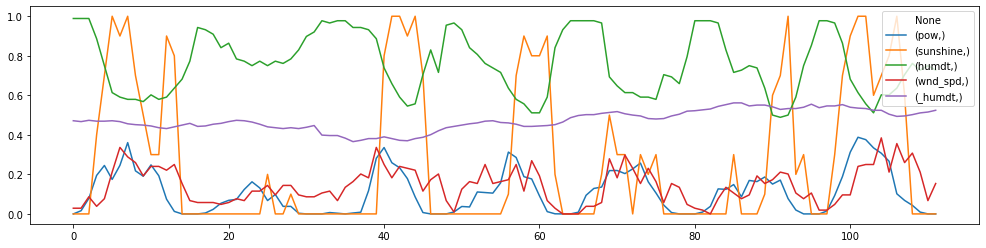

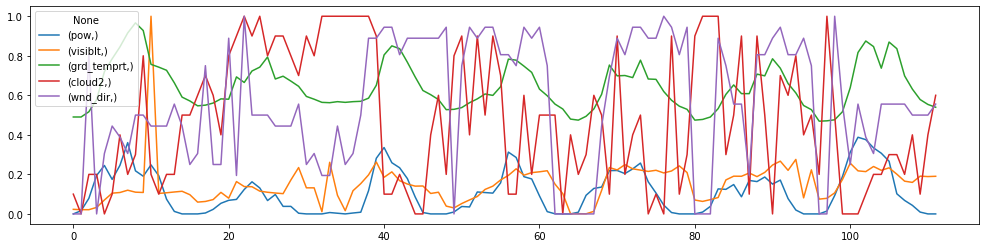

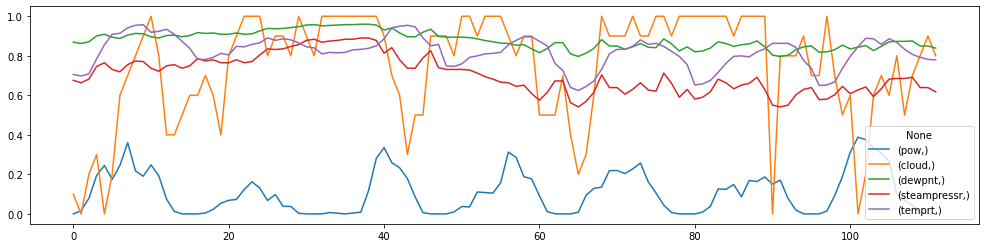

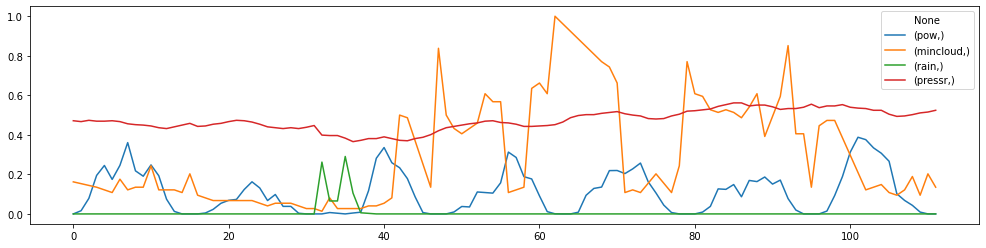

************************************************************************************************************************


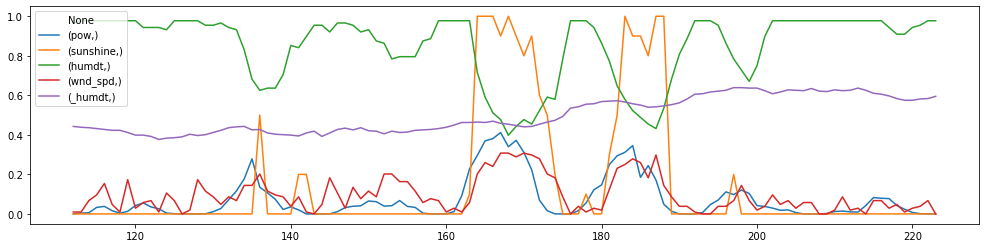

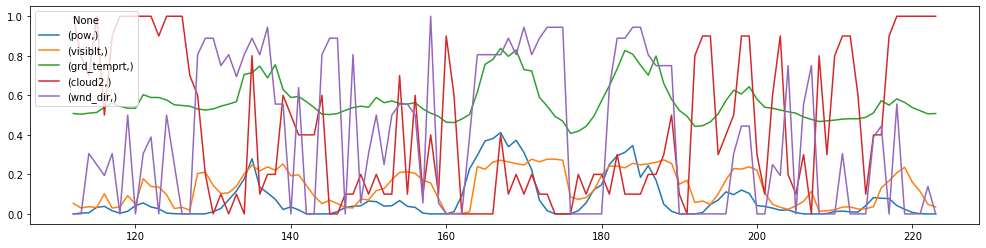

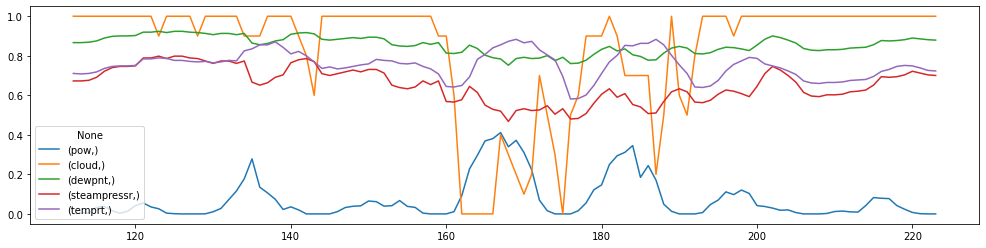

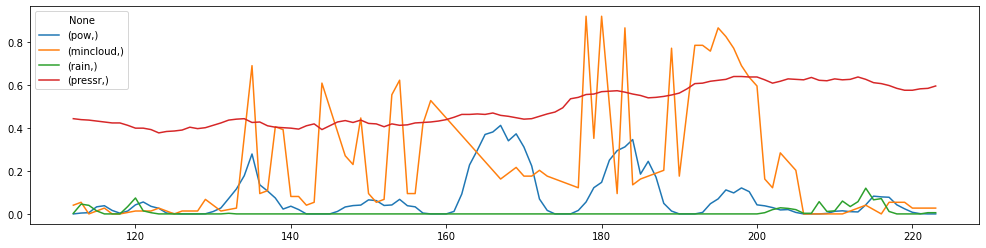

************************************************************************************************************************


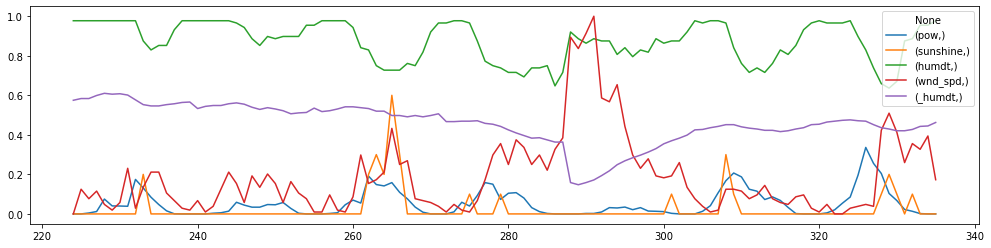

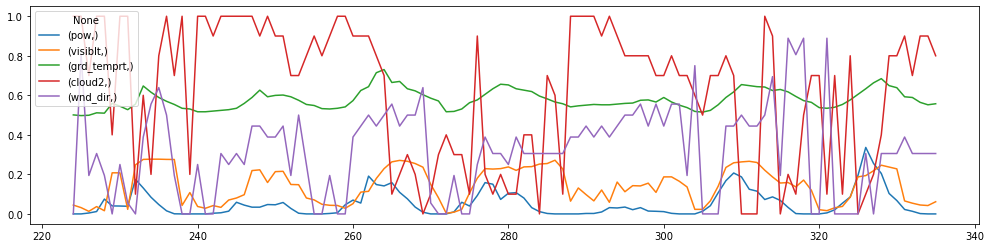

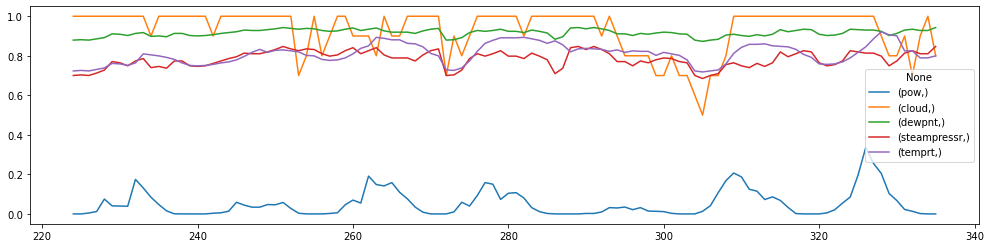

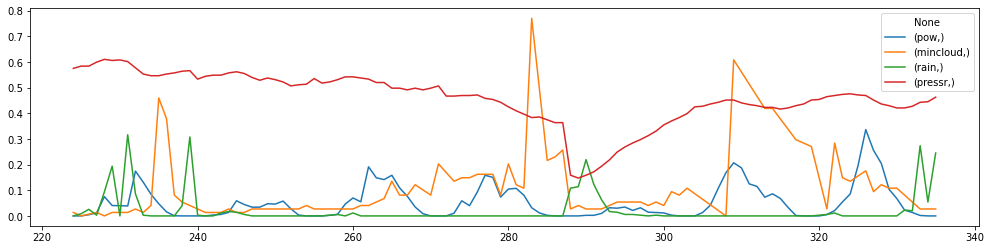

************************************************************************************************************************


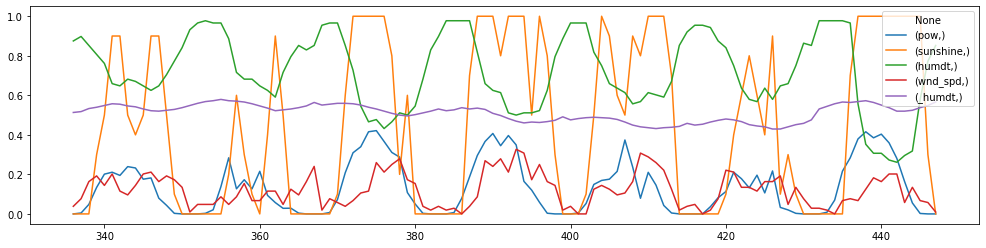

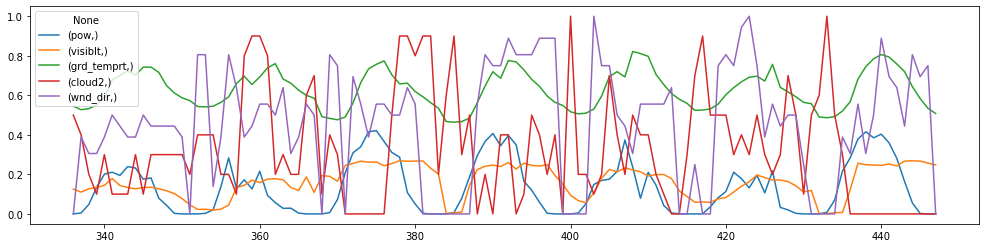

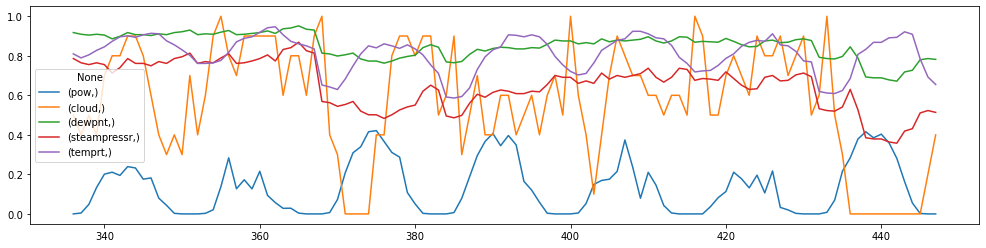

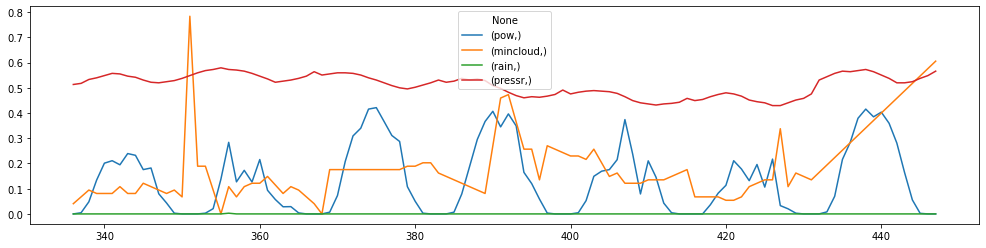

************************************************************************************************************************


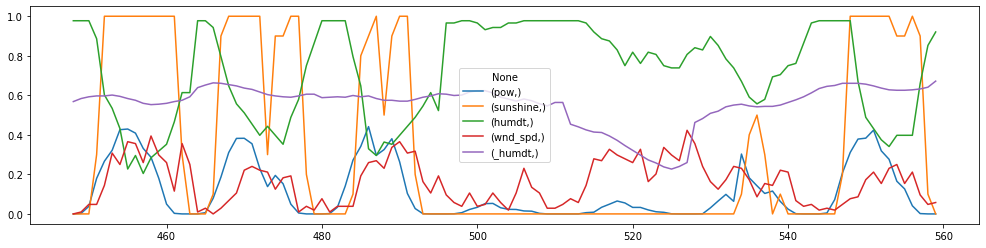

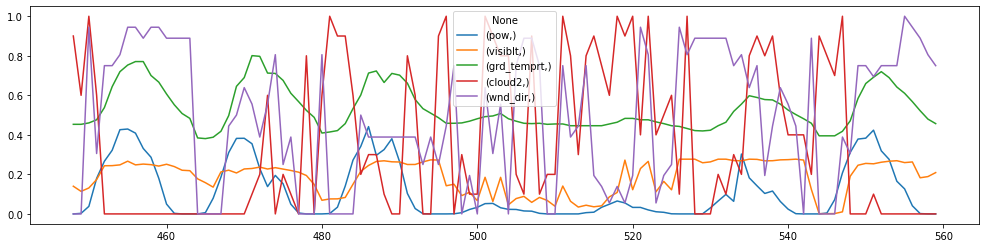

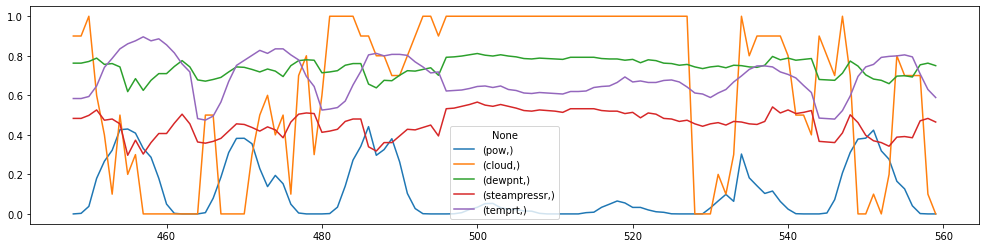

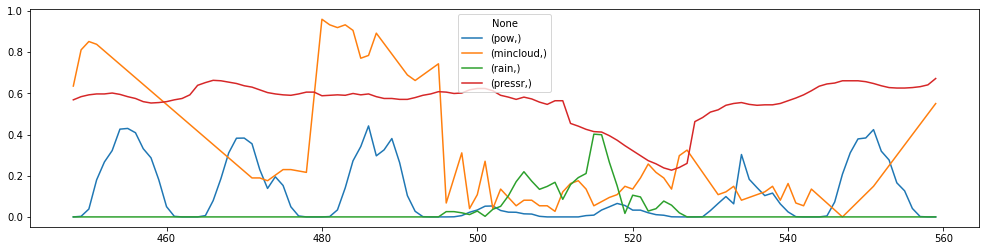

************************************************************************************************************************


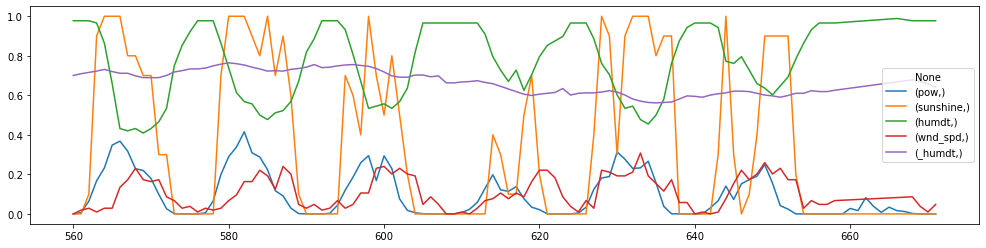

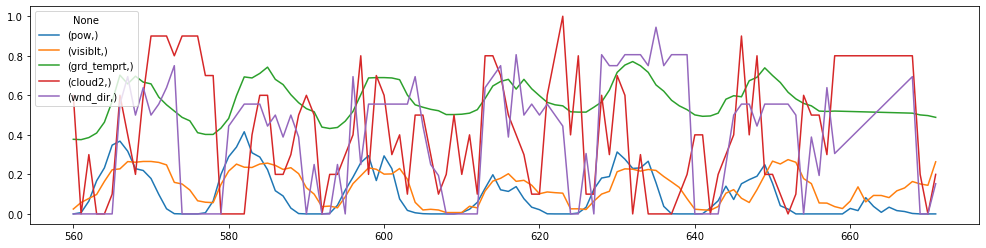

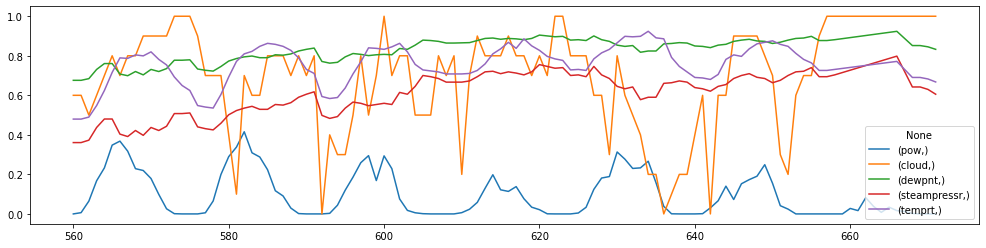

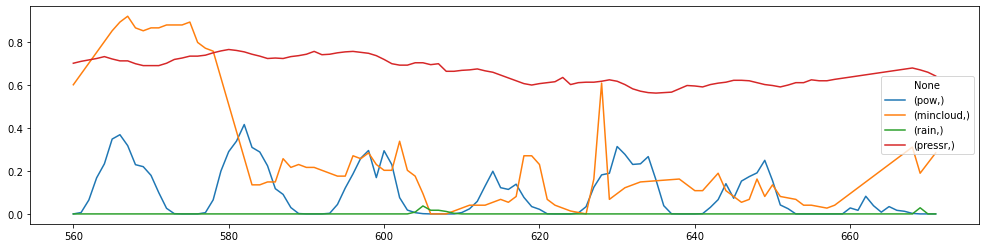

************************************************************************************************************************


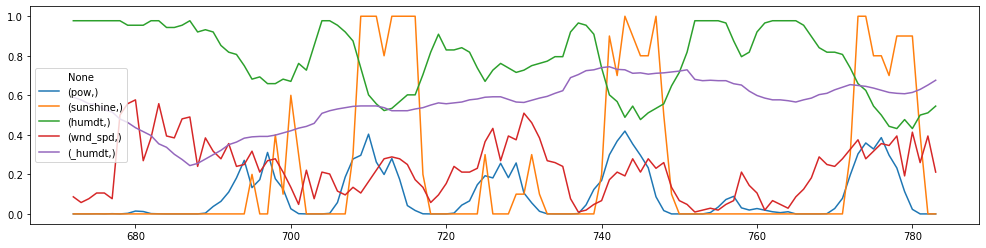

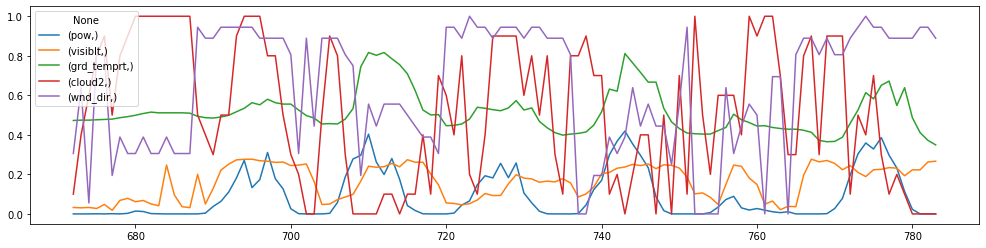

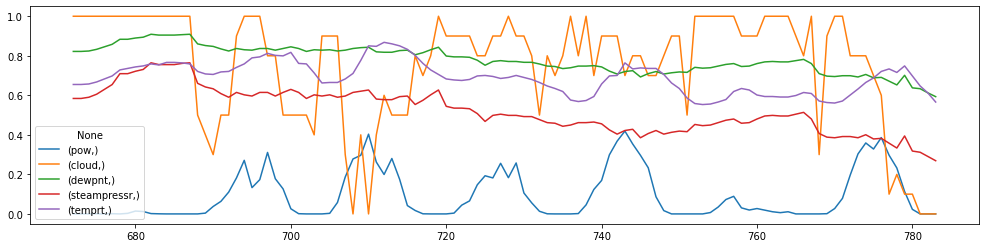

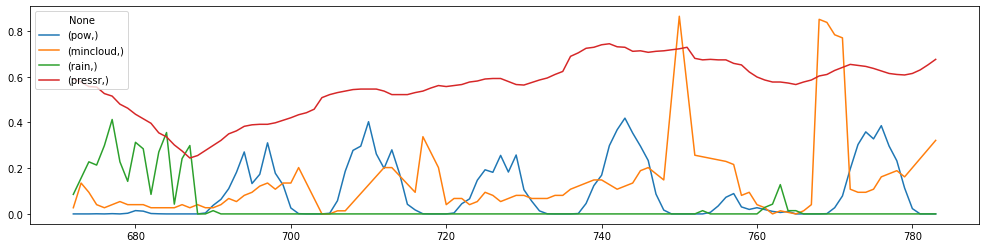

************************************************************************************************************************


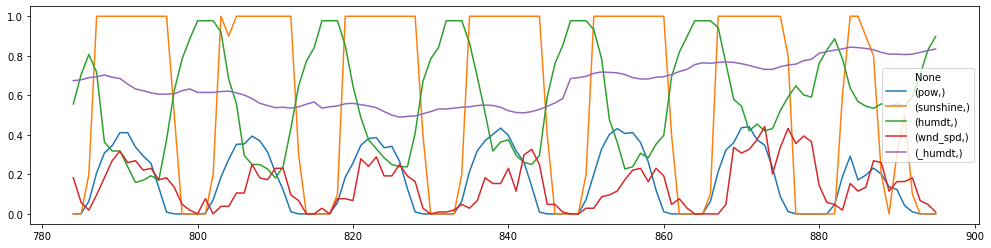

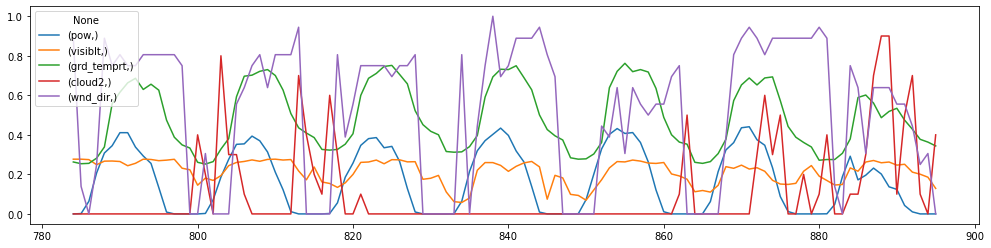

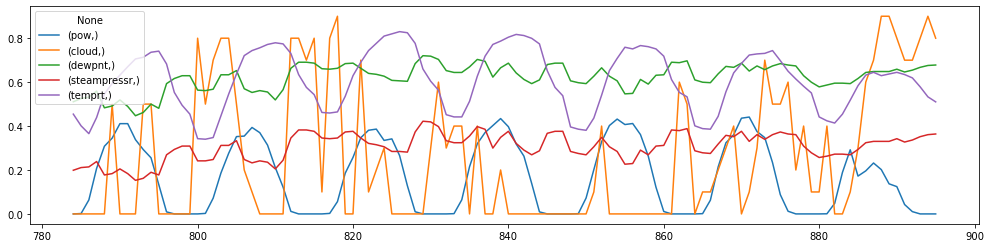

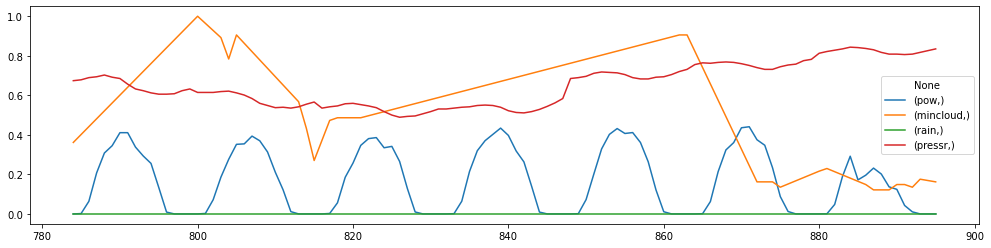

************************************************************************************************************************


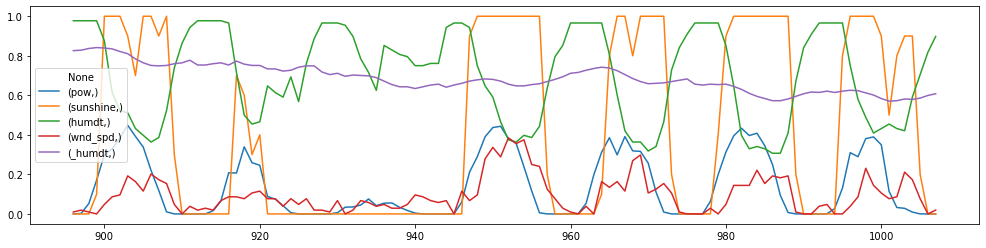

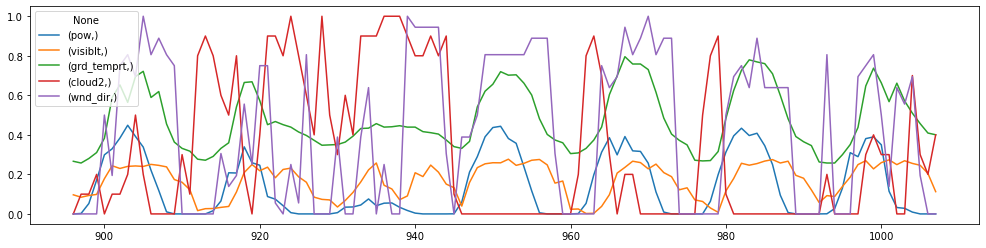

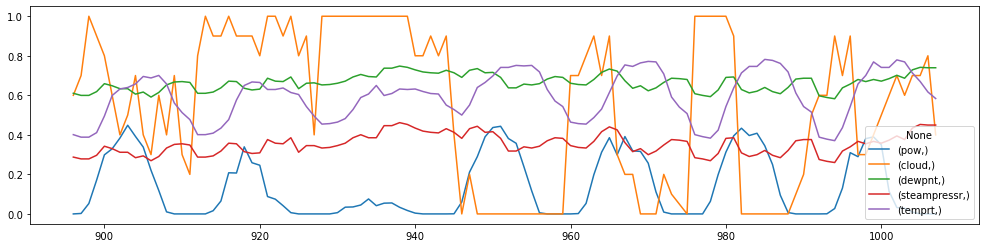

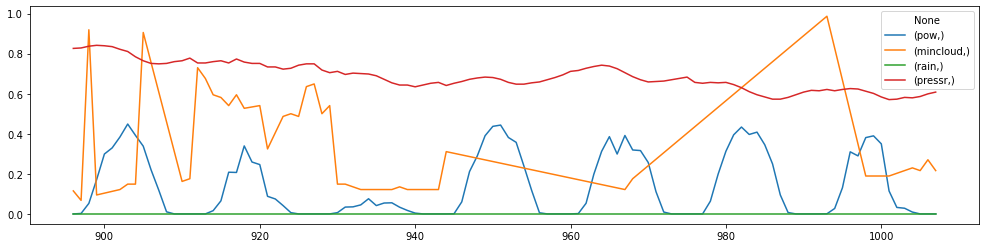

************************************************************************************************************************


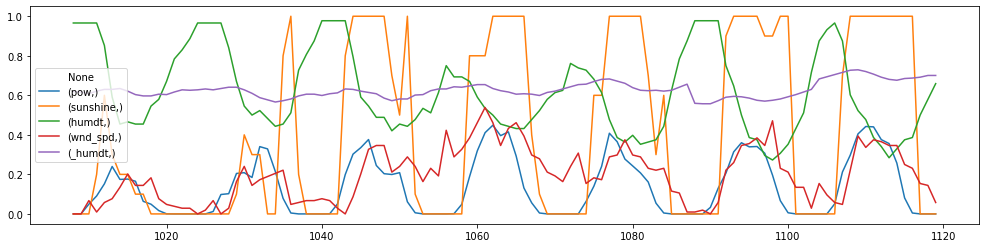

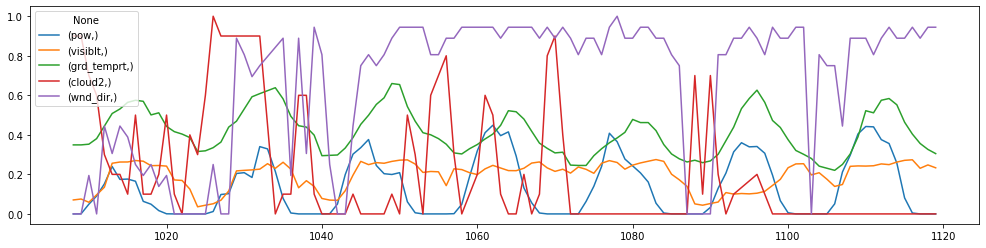

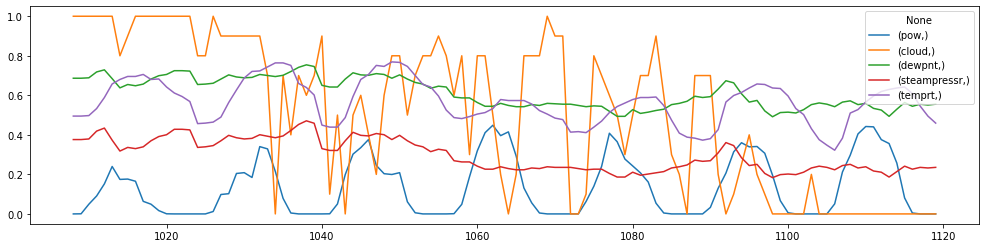

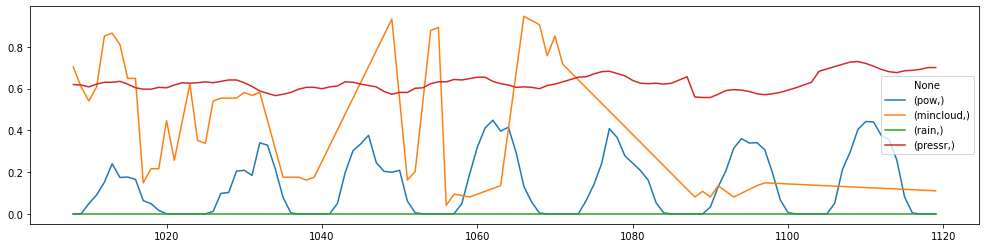

************************************************************************************************************************


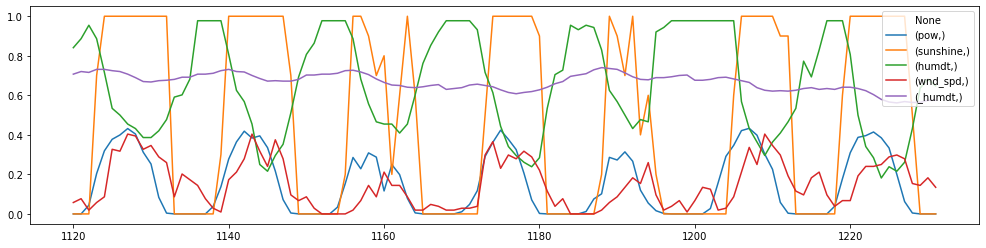

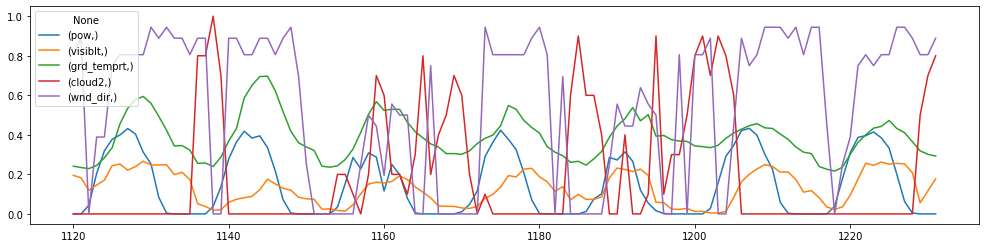

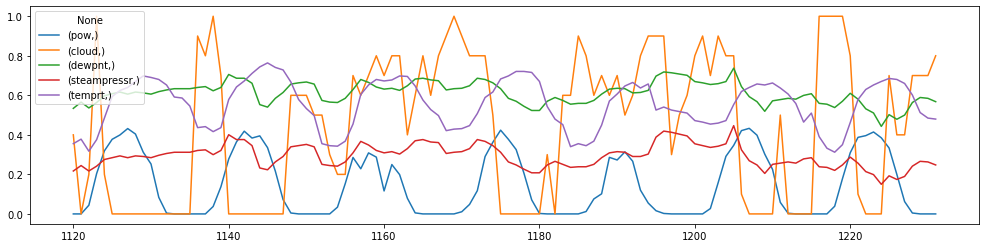

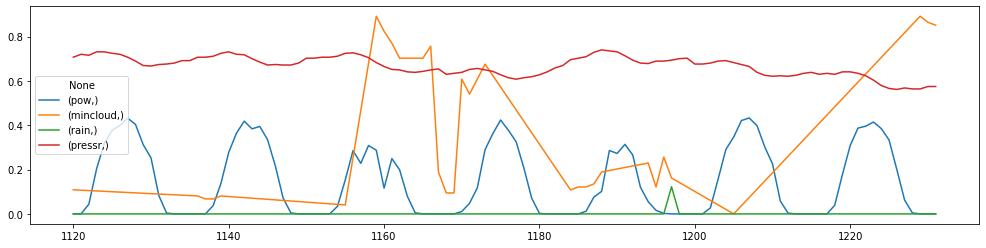

************************************************************************************************************************


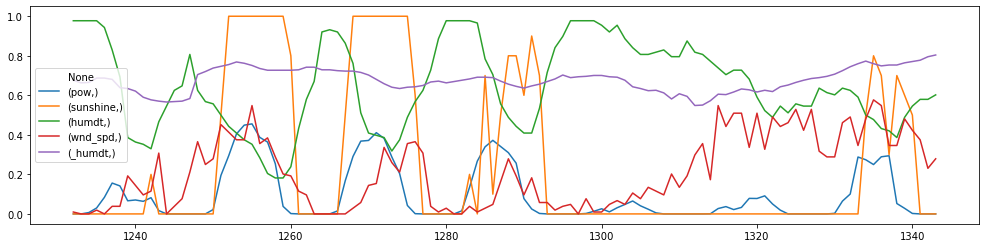

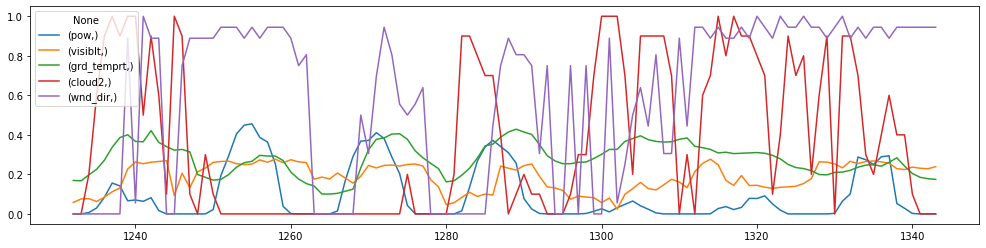

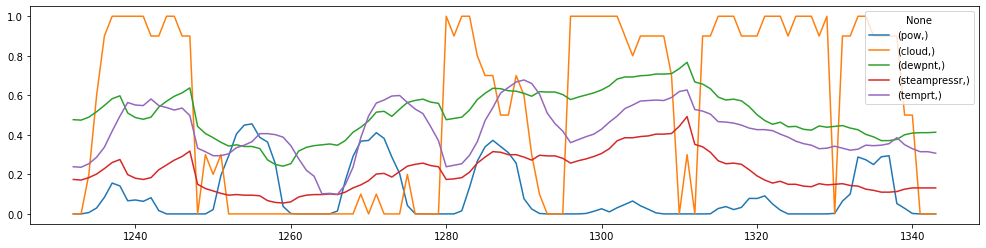

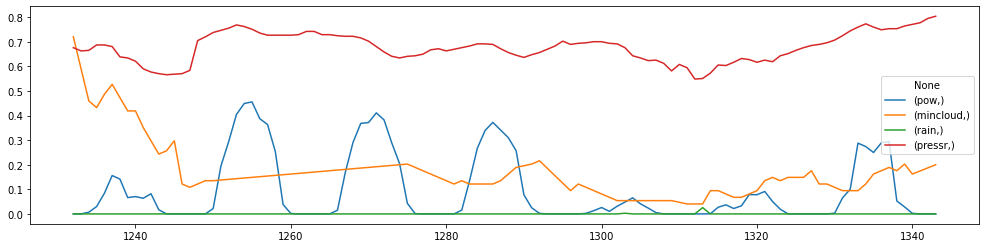

************************************************************************************************************************


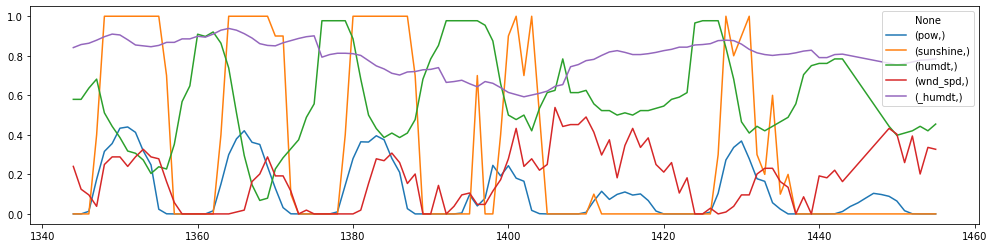

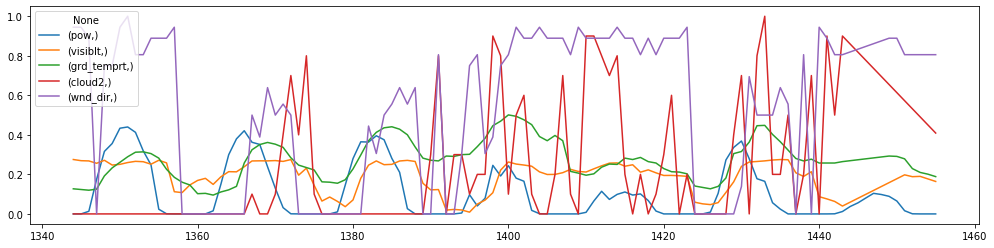

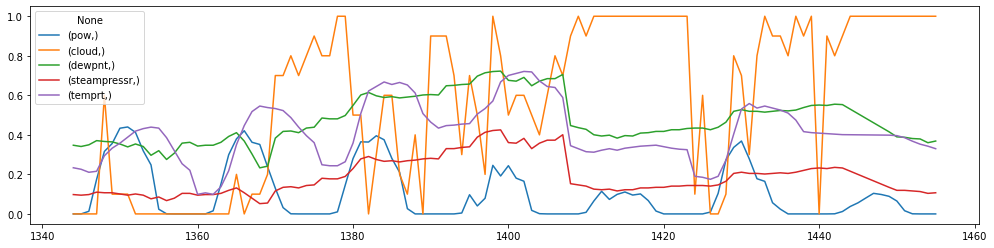

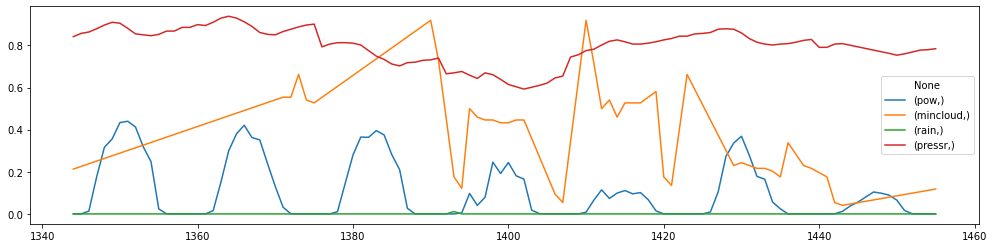

************************************************************************************************************************


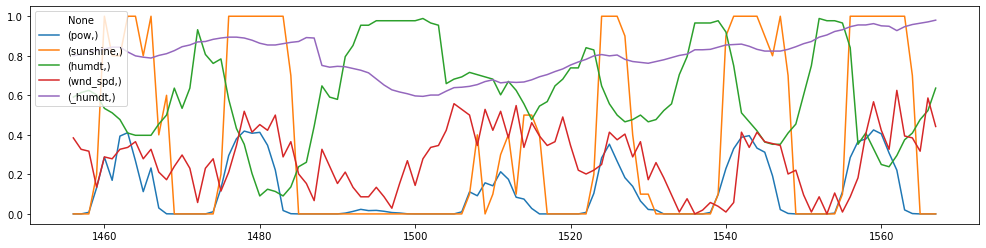

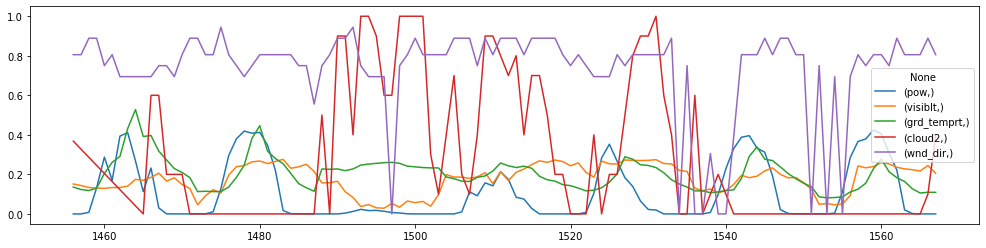

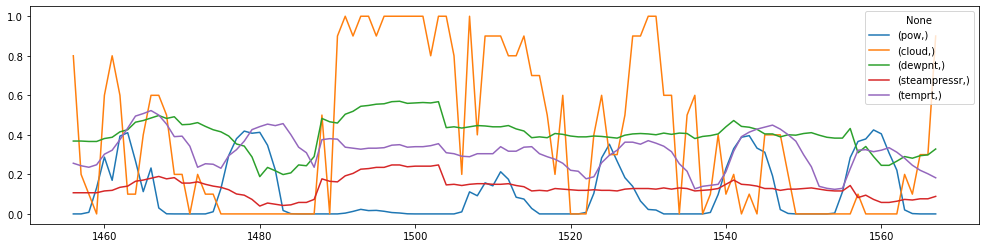

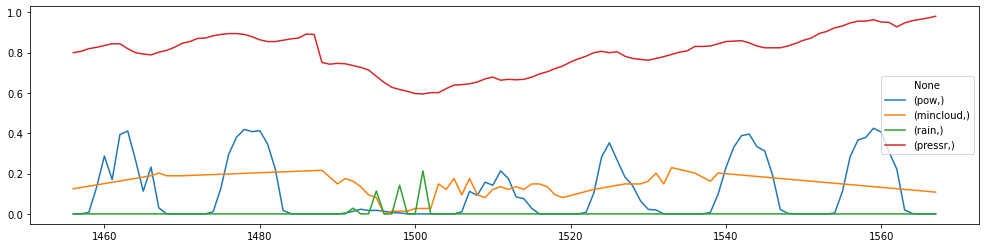

************************************************************************************************************************


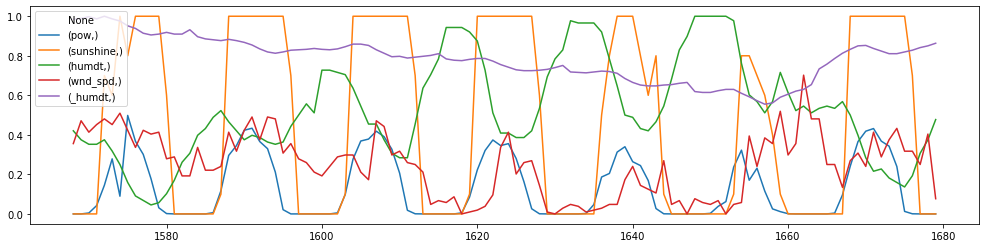

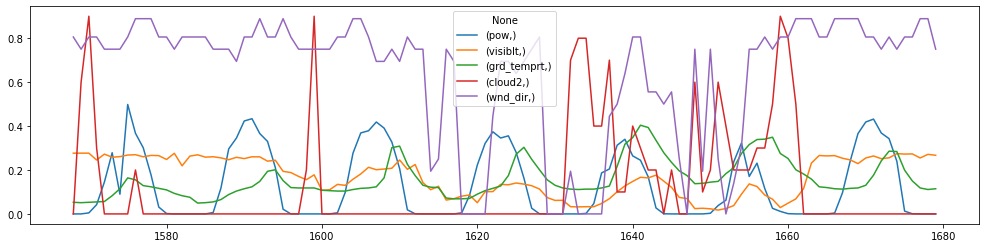

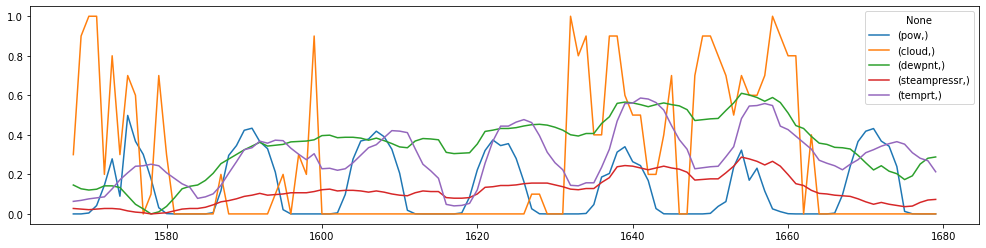

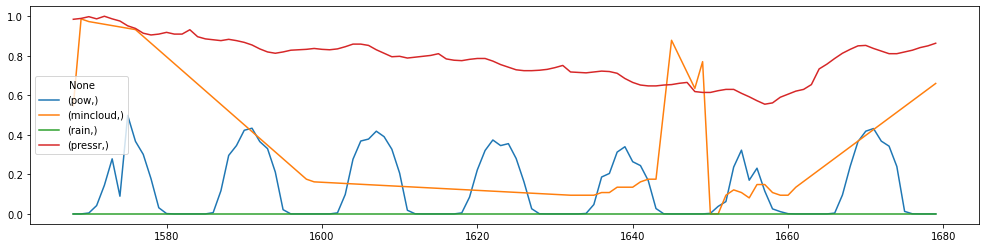

************************************************************************************************************************


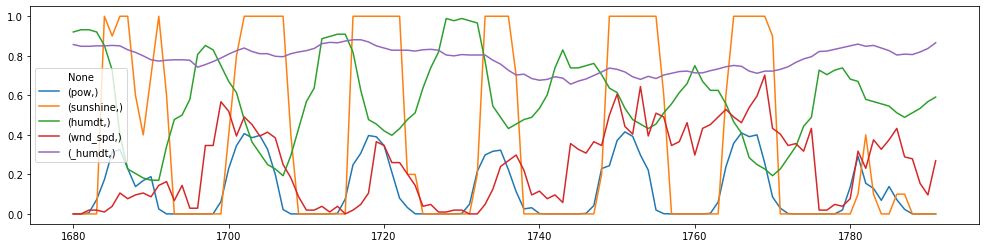

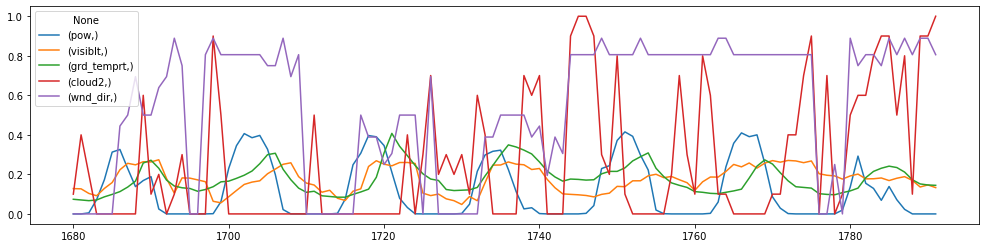

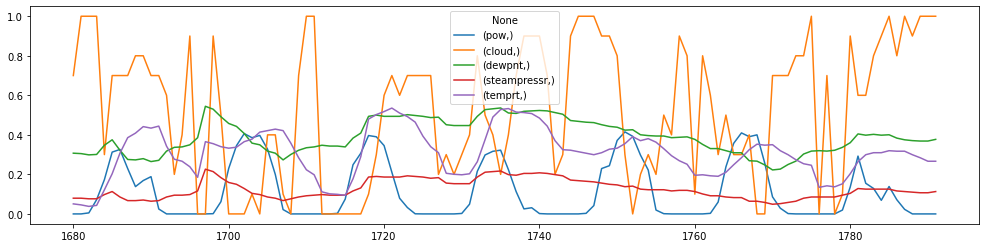

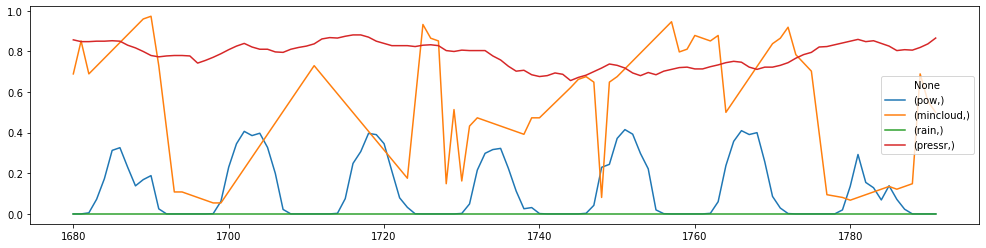

************************************************************************************************************************


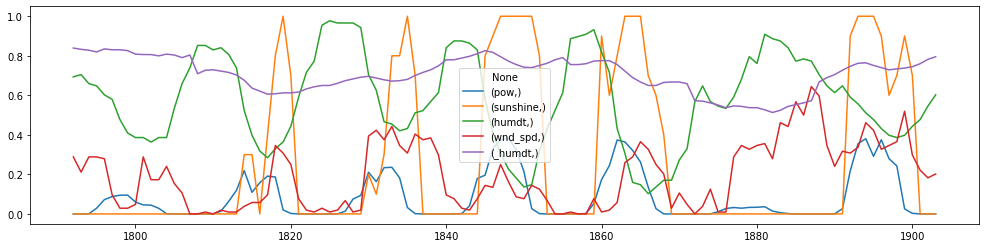

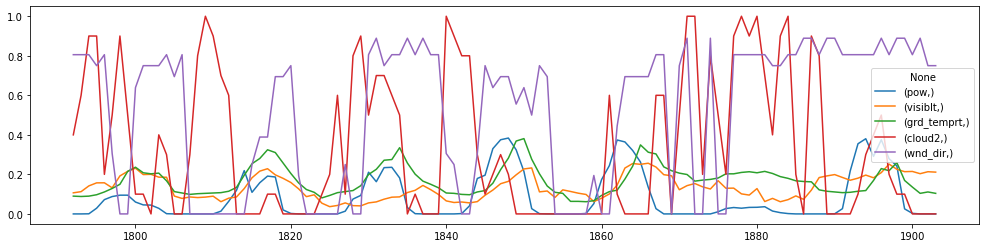

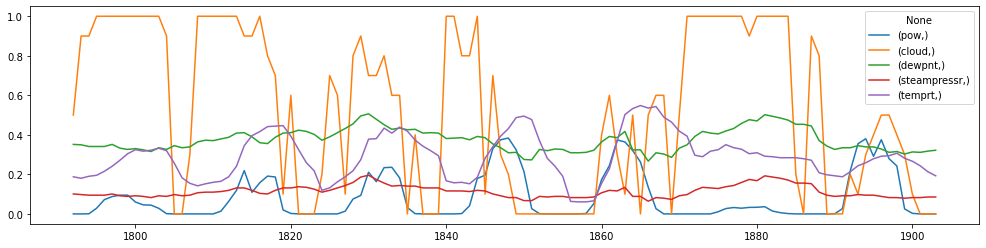

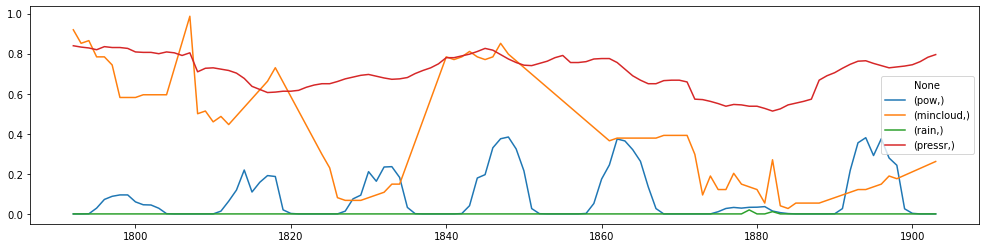

************************************************************************************************************************


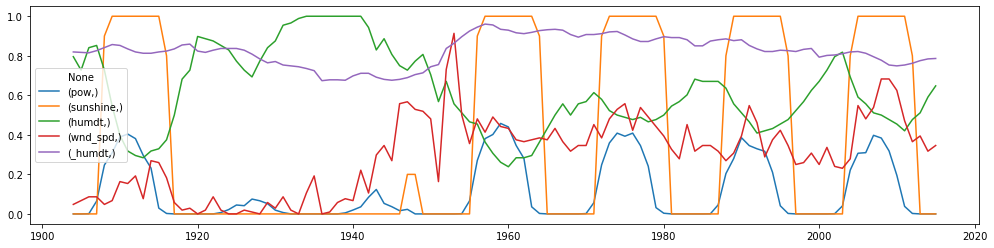

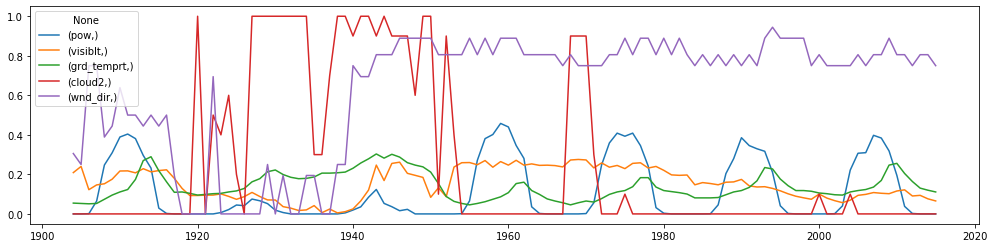

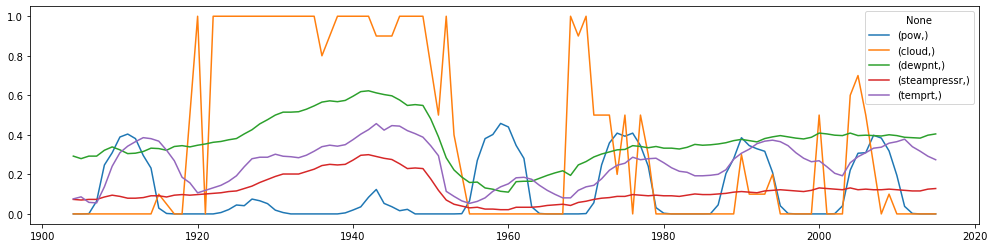

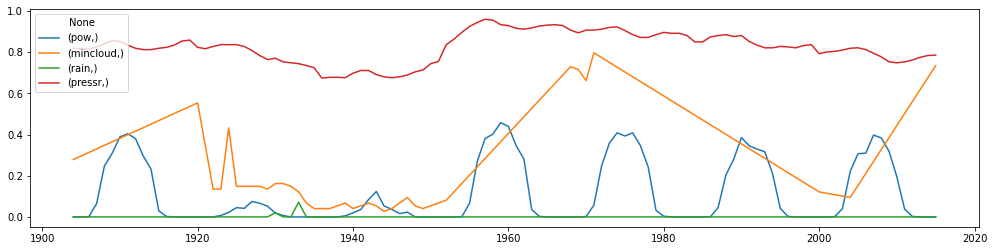

************************************************************************************************************************


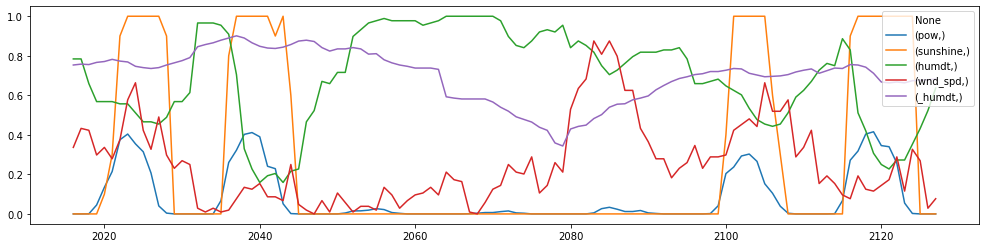

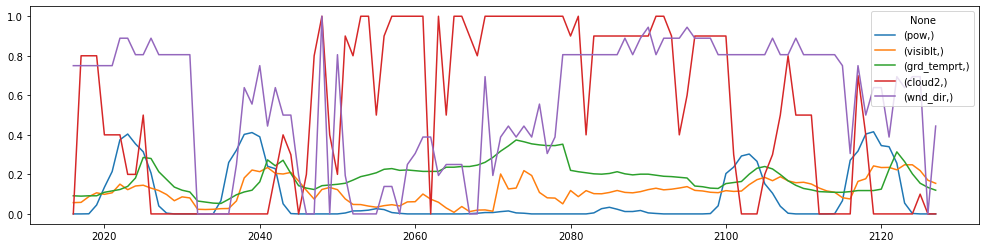

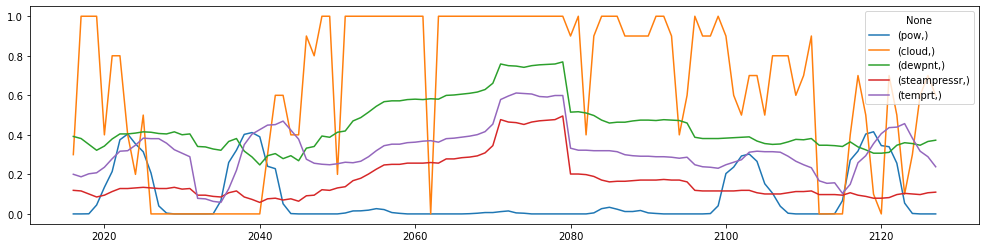

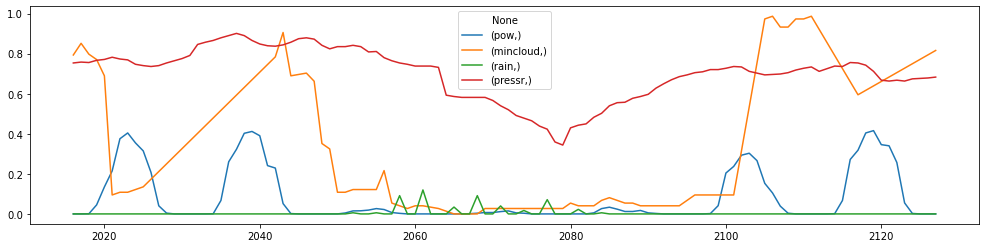

************************************************************************************************************************


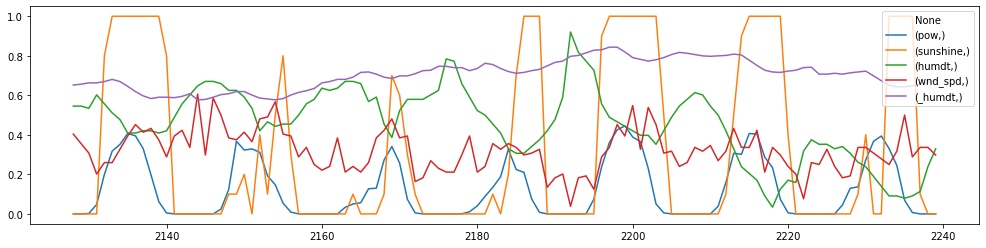

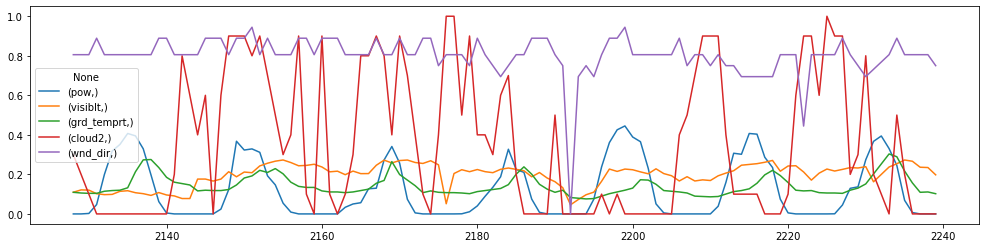

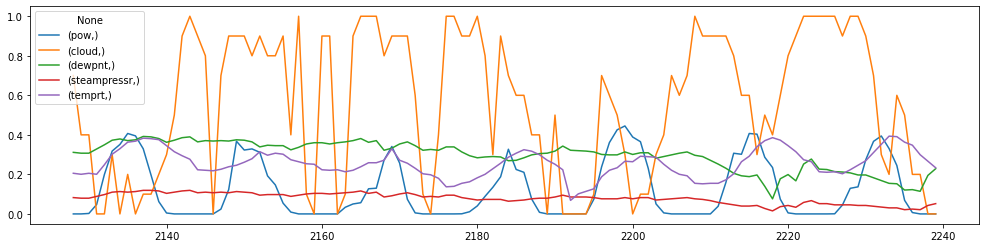

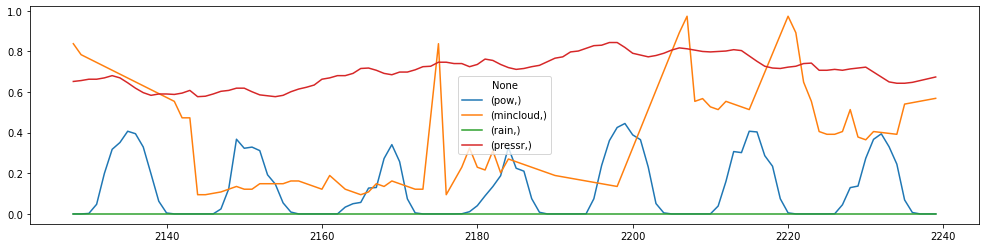

************************************************************************************************************************


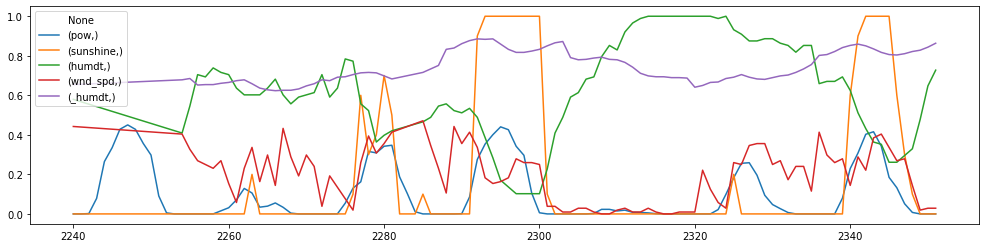

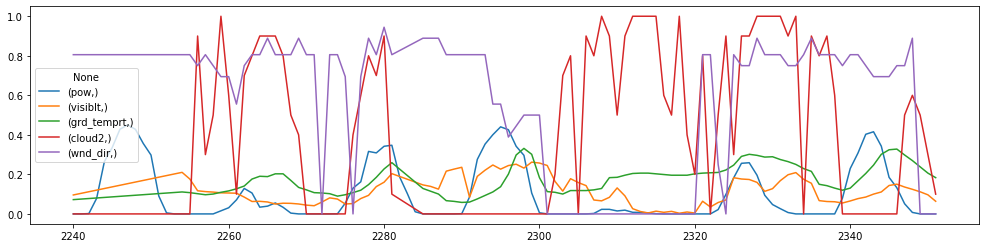

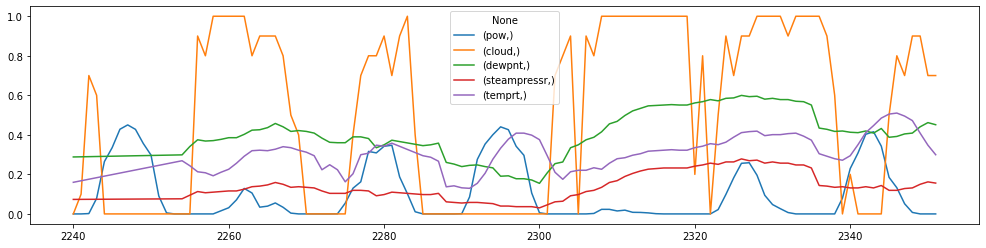

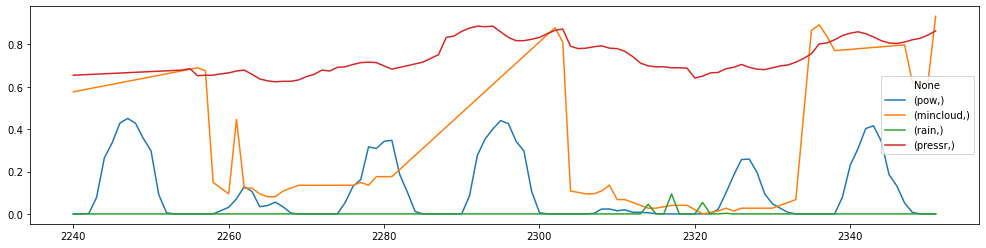

************************************************************************************************************************


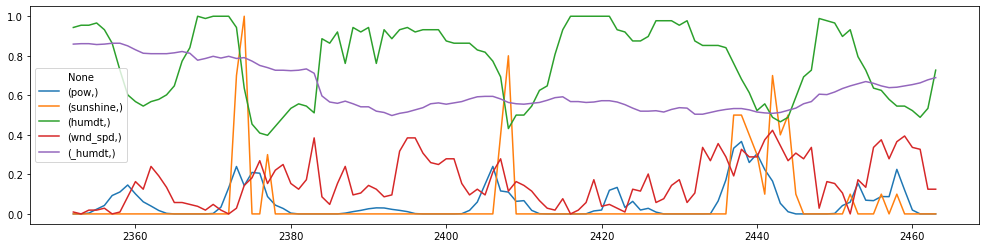

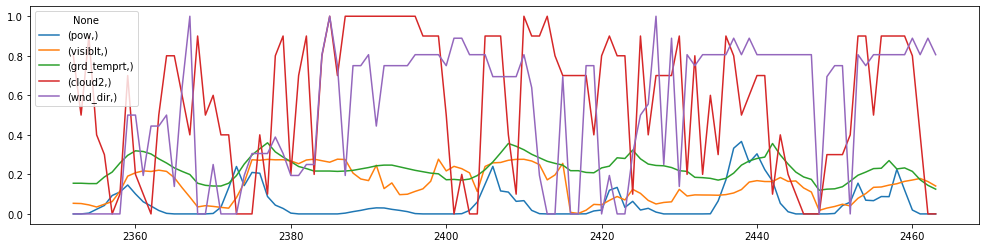

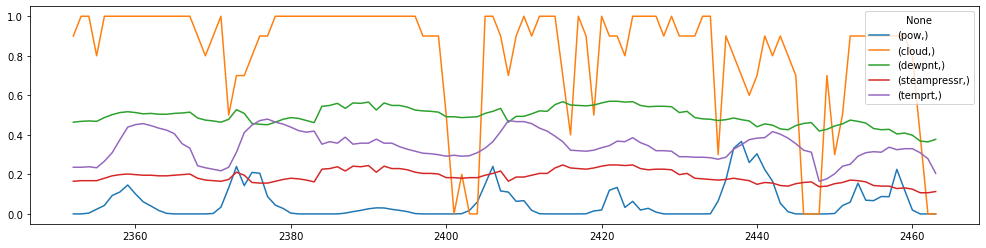

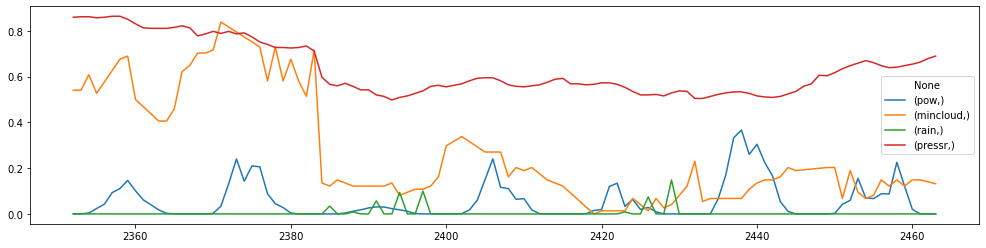

************************************************************************************************************************


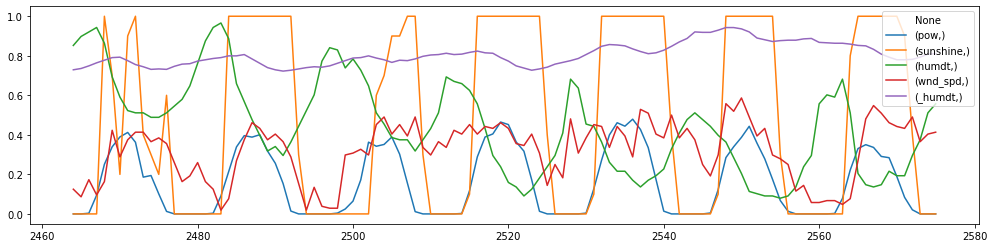

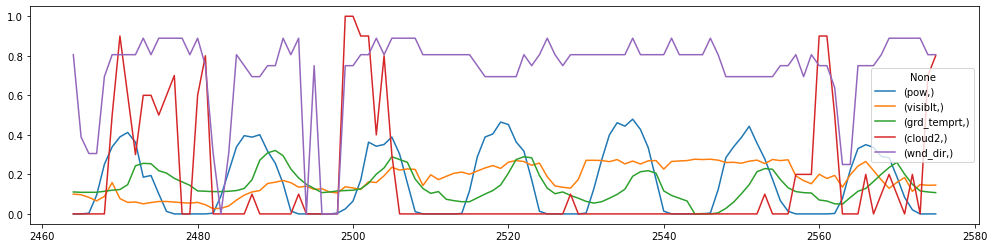

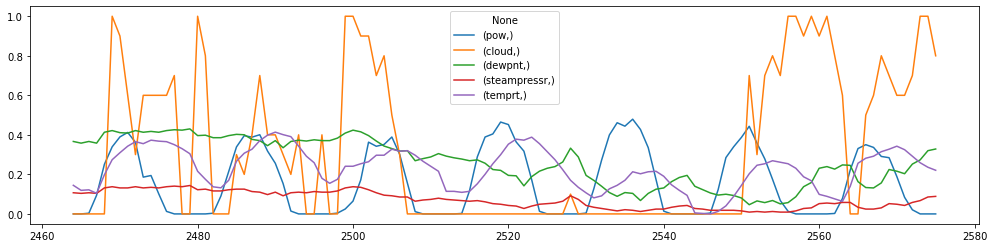

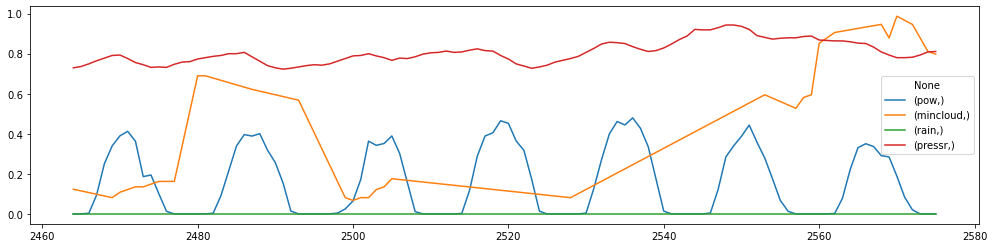

************************************************************************************************************************


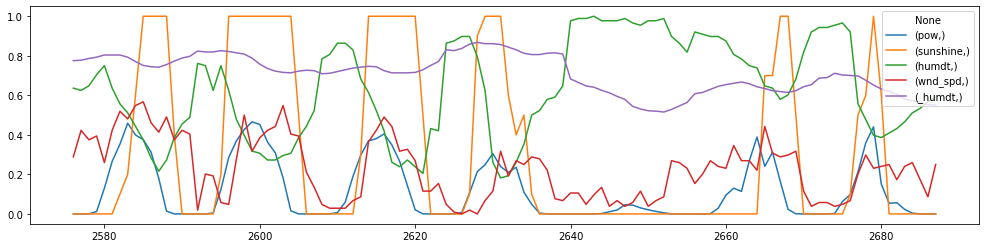

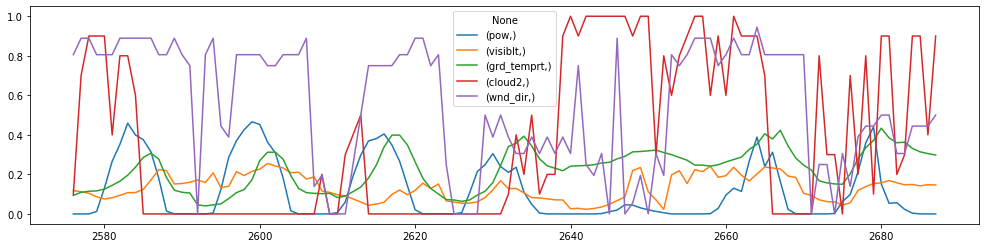

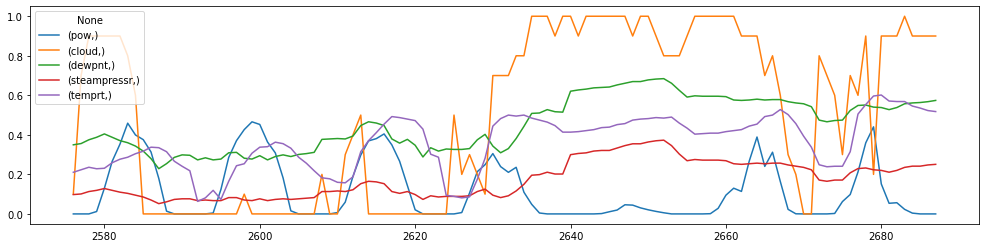

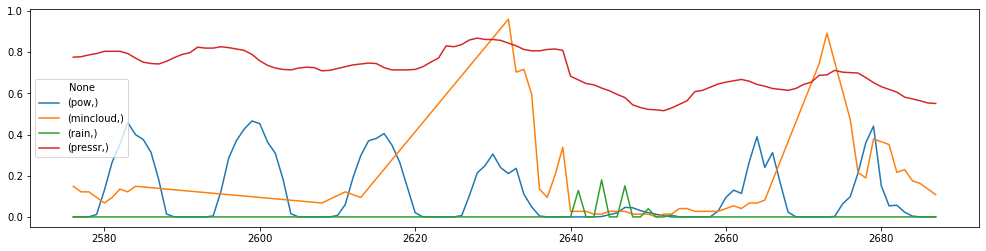

************************************************************************************************************************


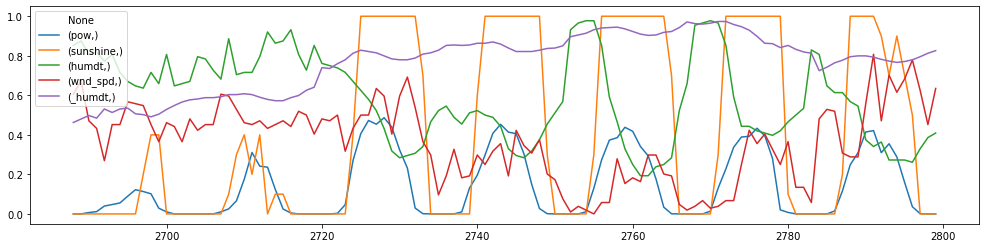

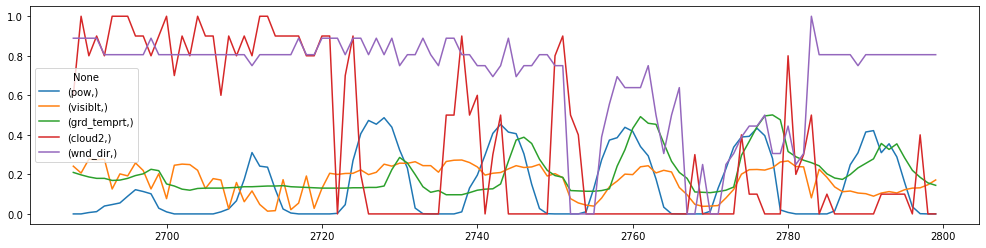

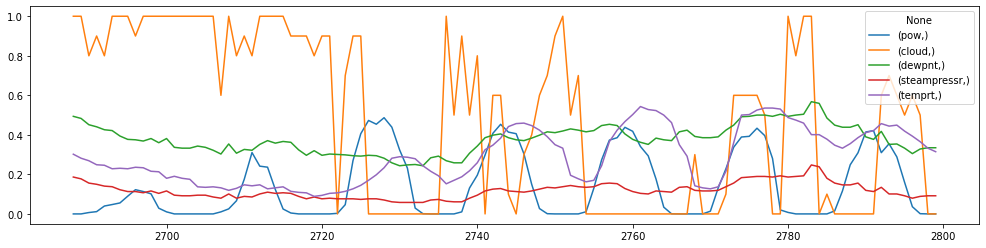

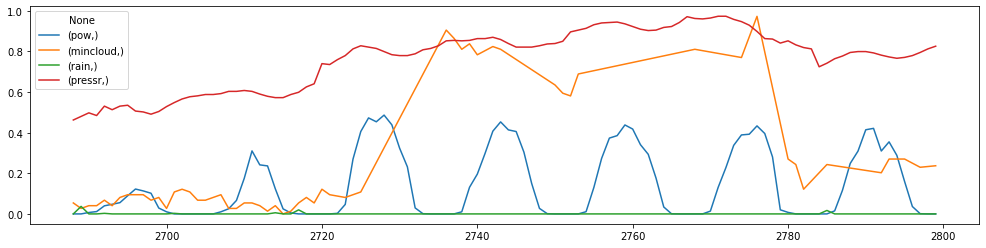

************************************************************************************************************************


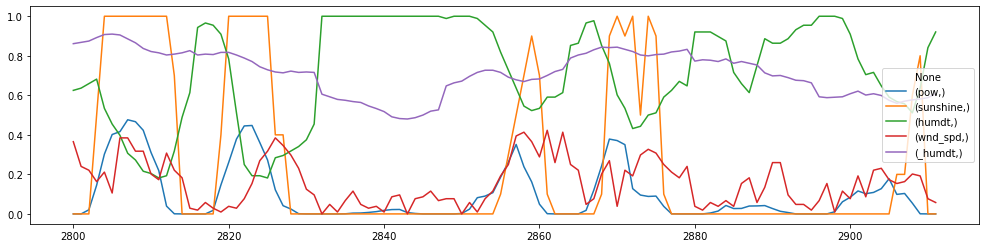

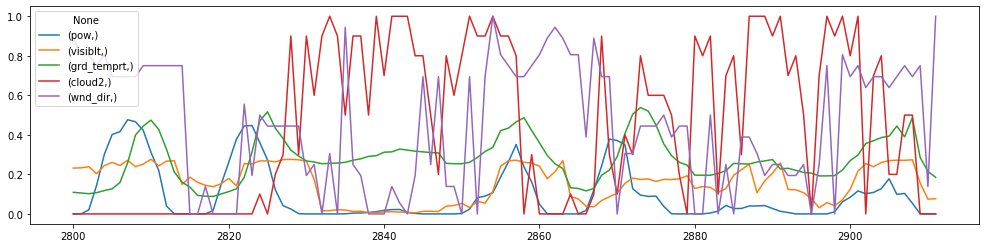

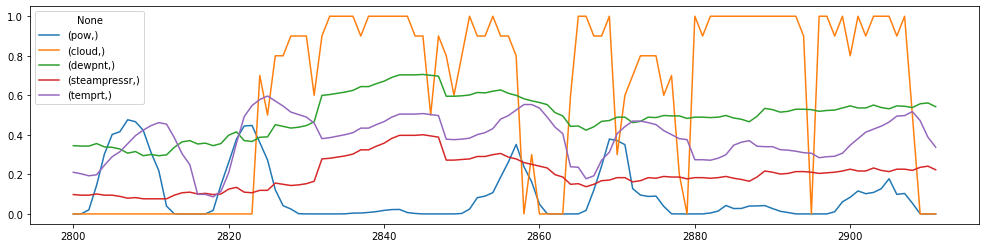

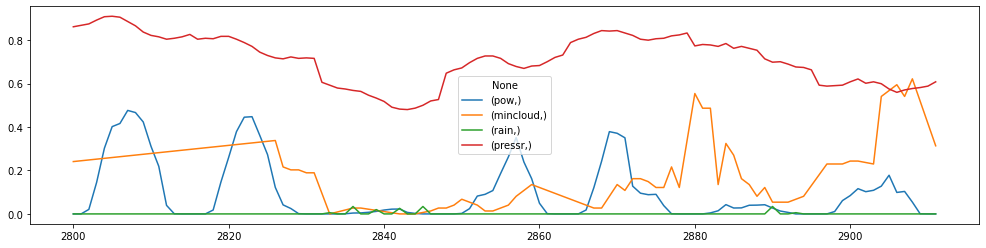

************************************************************************************************************************


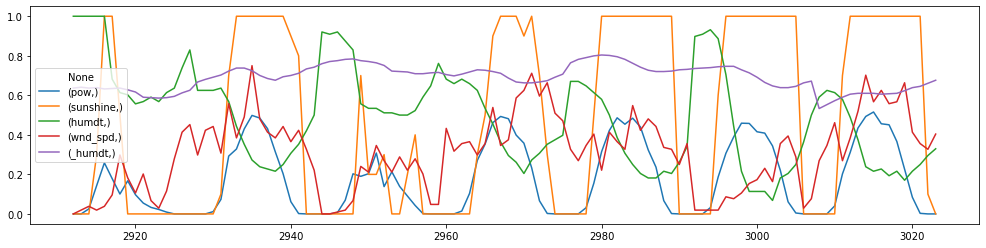

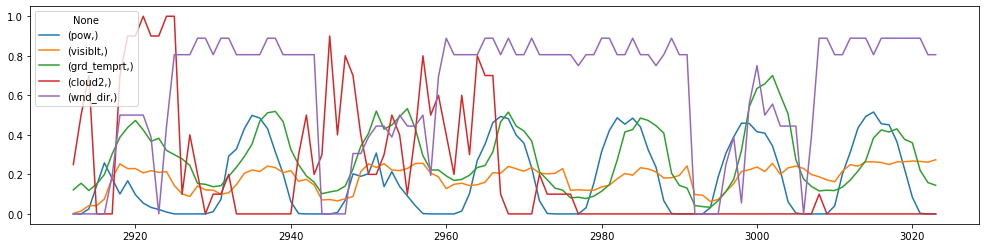

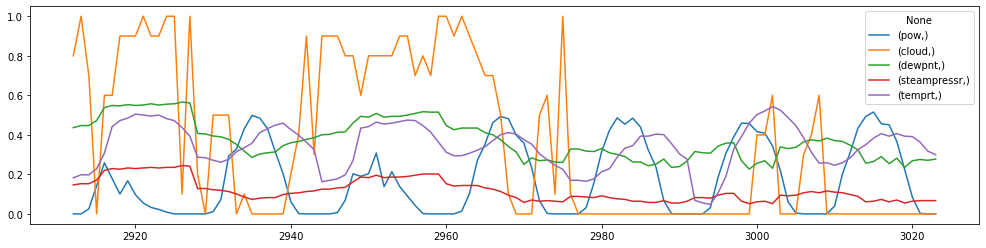

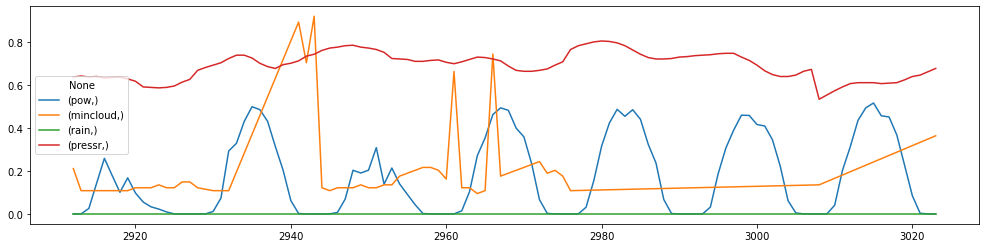

************************************************************************************************************************


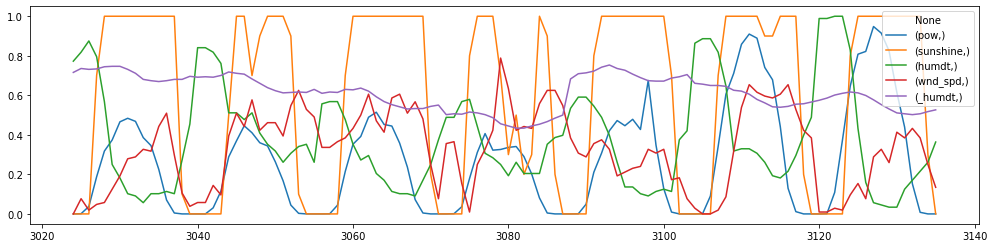

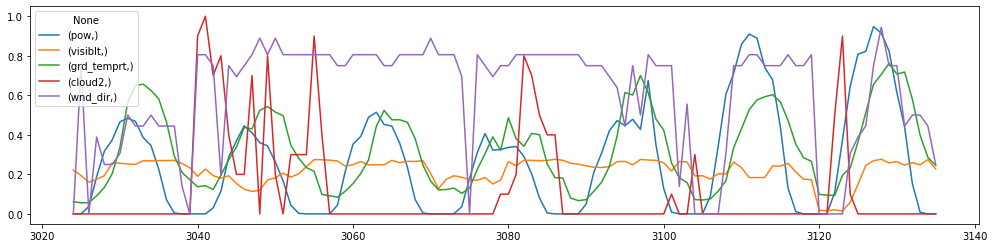

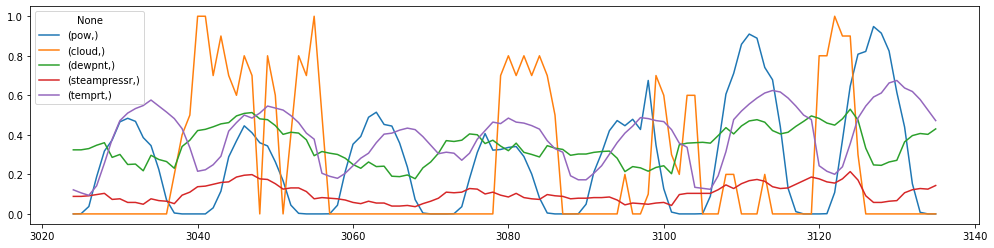

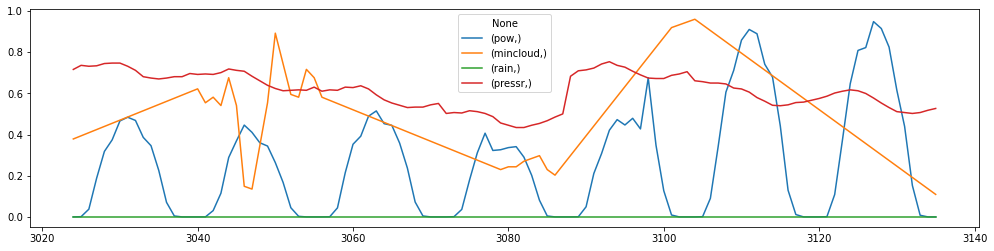

************************************************************************************************************************


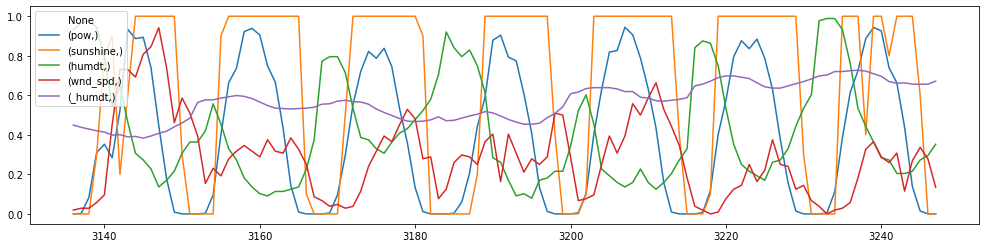

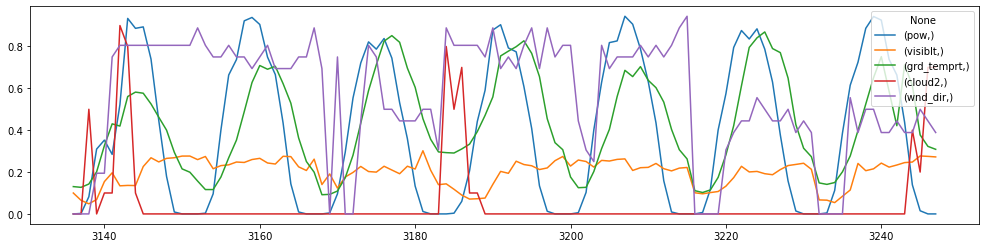

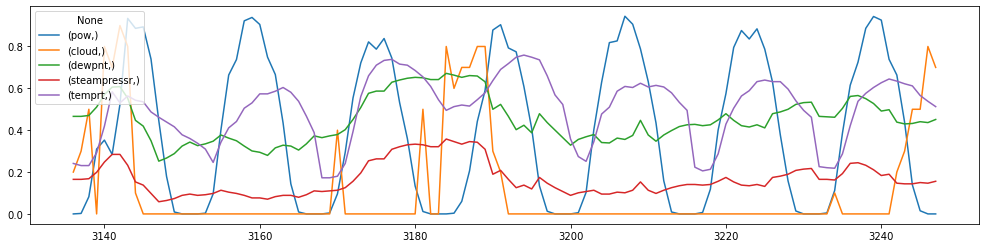

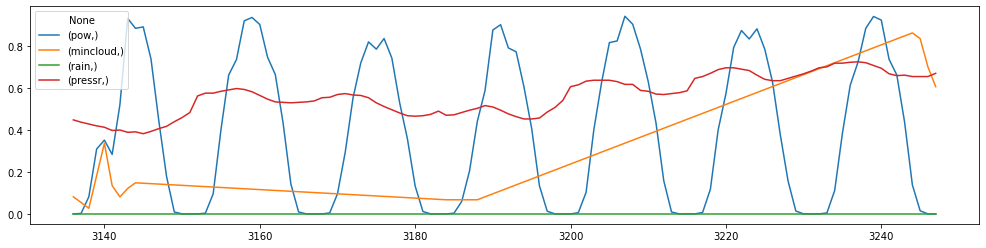

************************************************************************************************************************


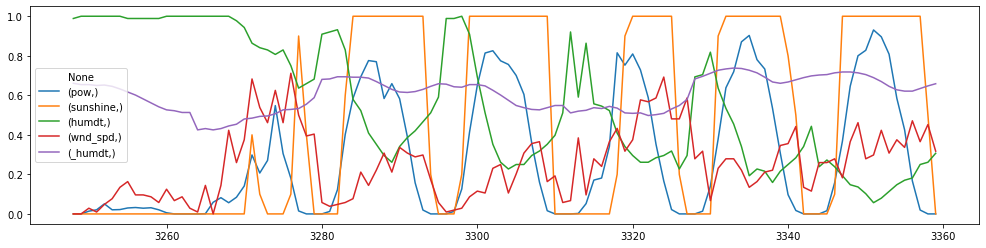

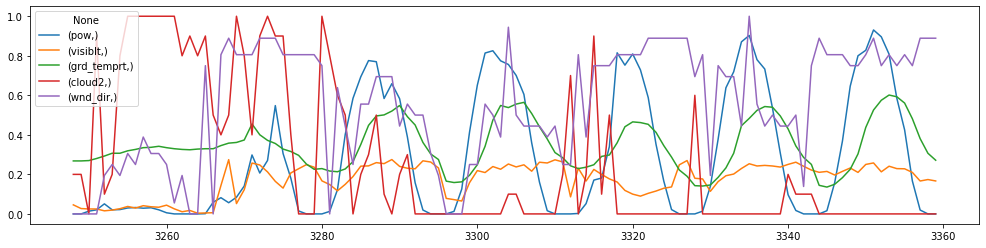

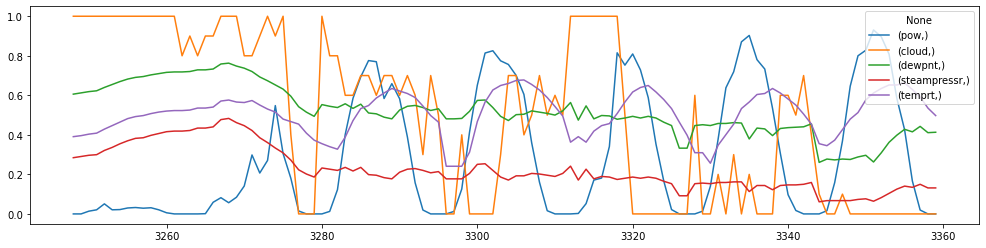

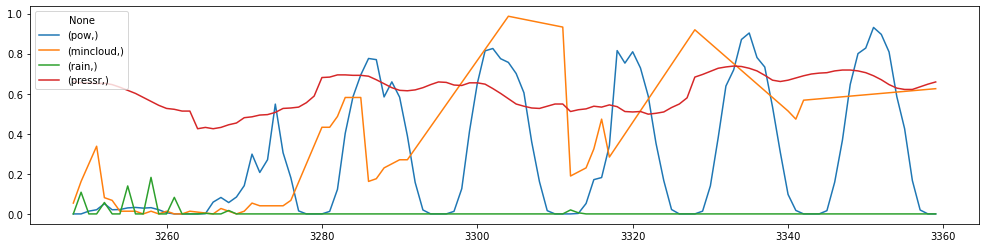

************************************************************************************************************************


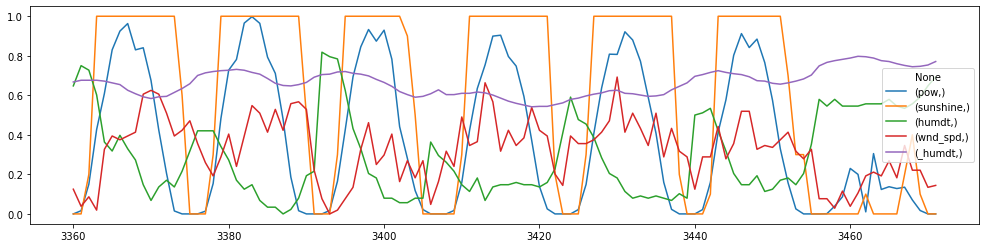

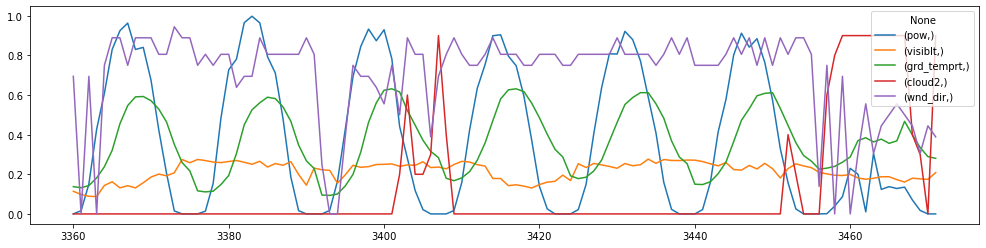

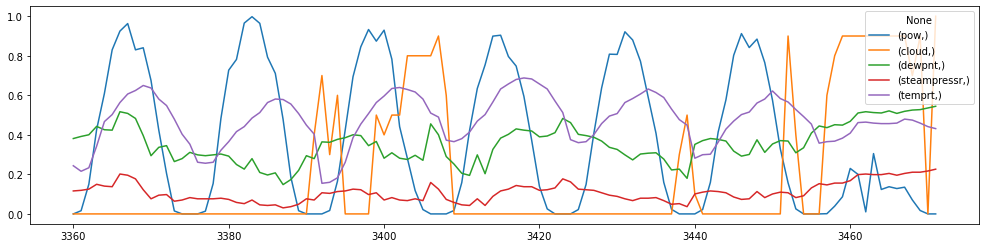

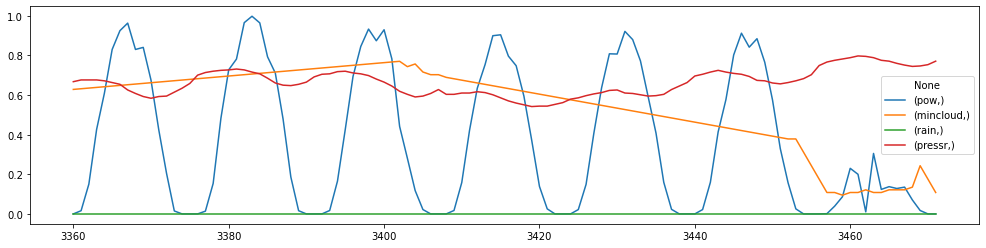

************************************************************************************************************************


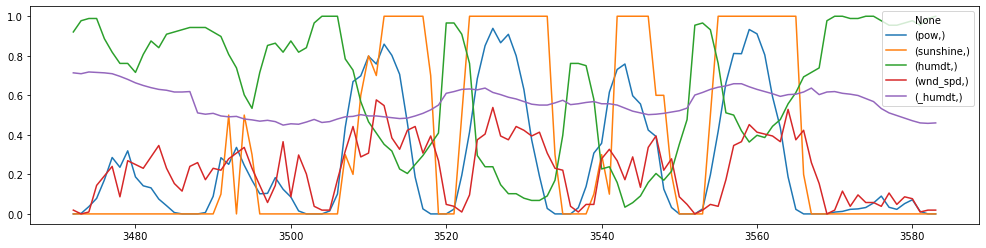

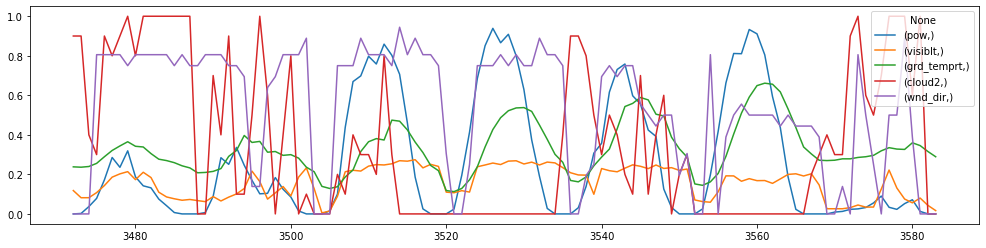

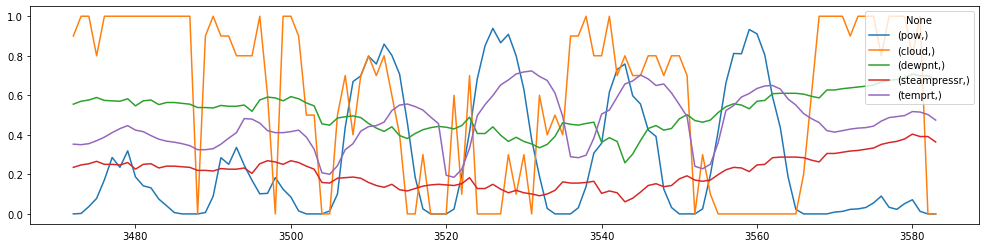

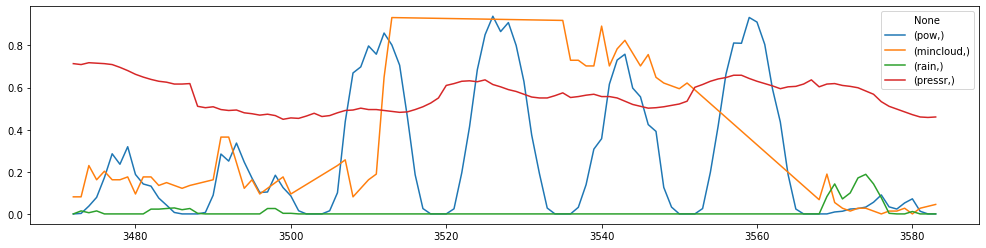

************************************************************************************************************************


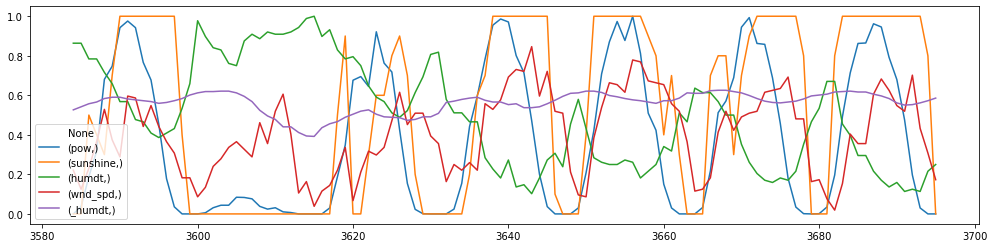

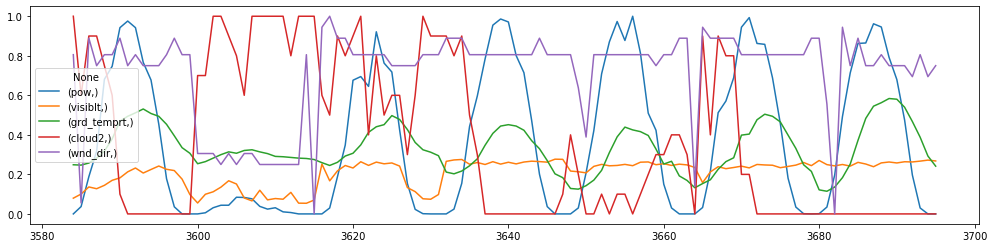

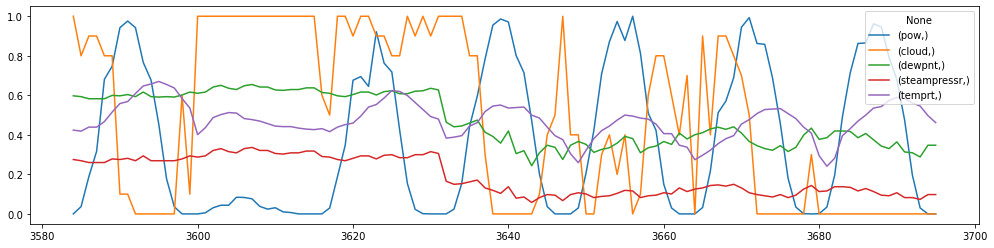

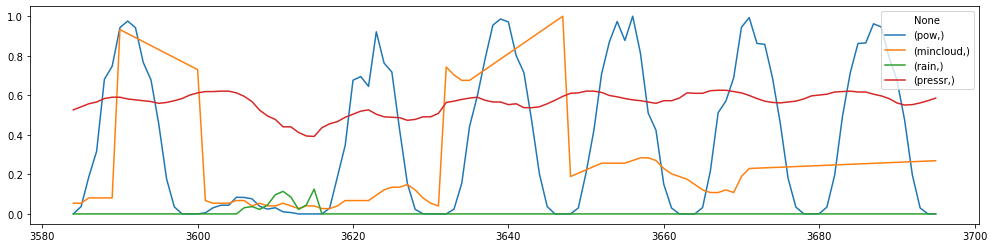

************************************************************************************************************************


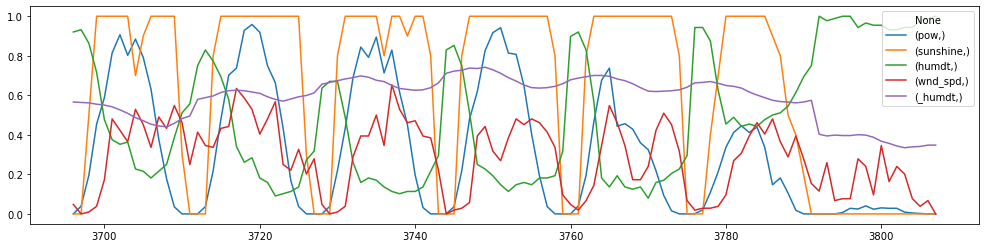

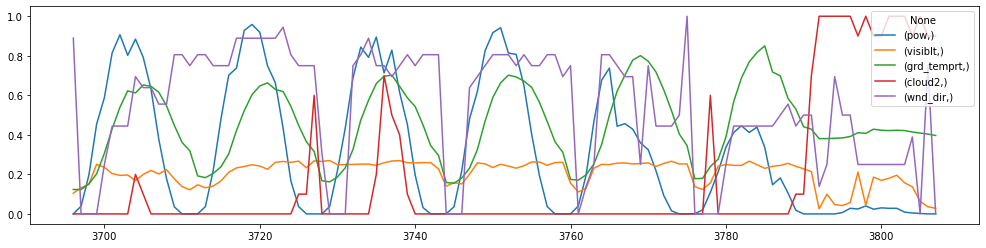

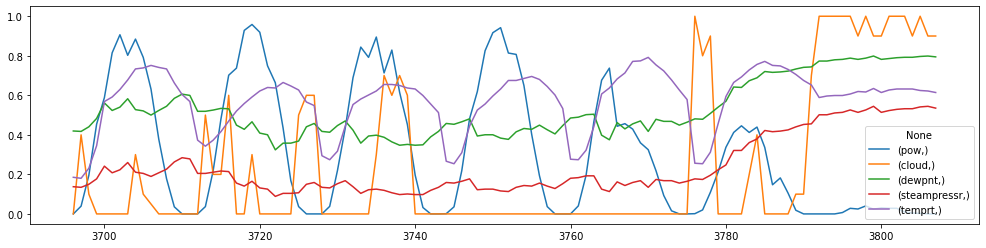

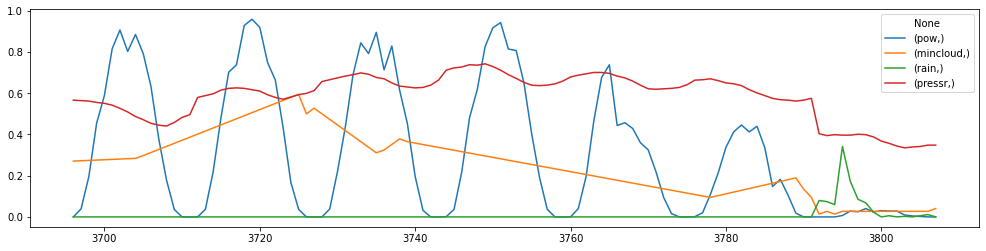

************************************************************************************************************************


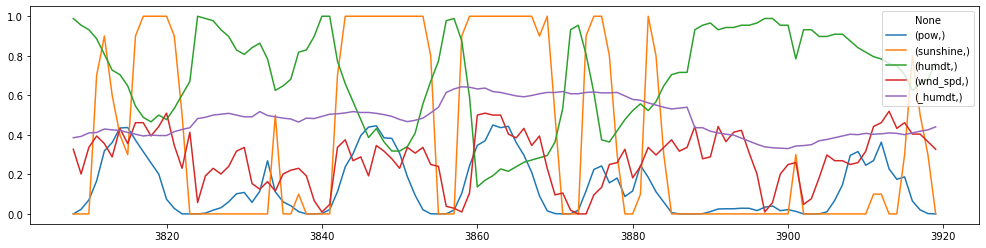

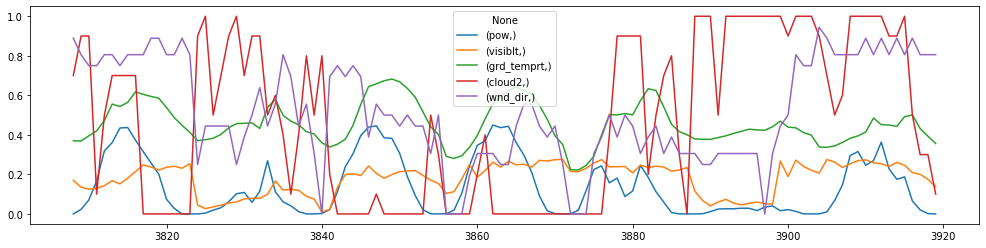

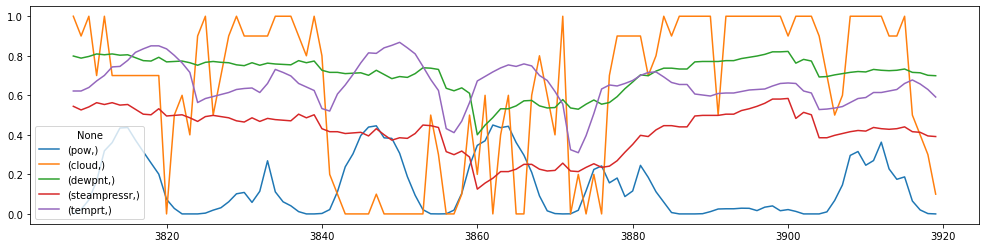

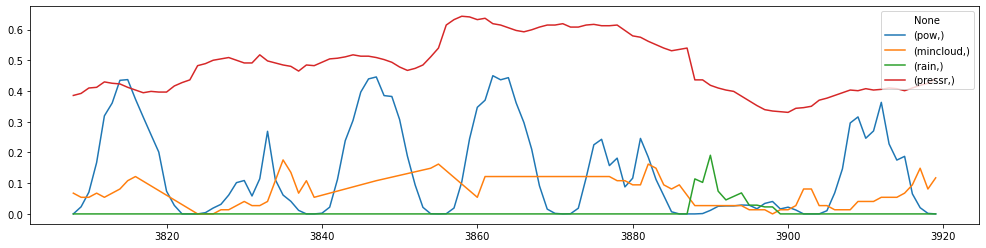

************************************************************************************************************************


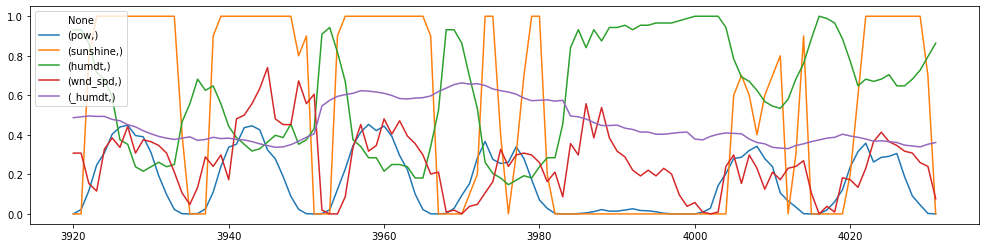

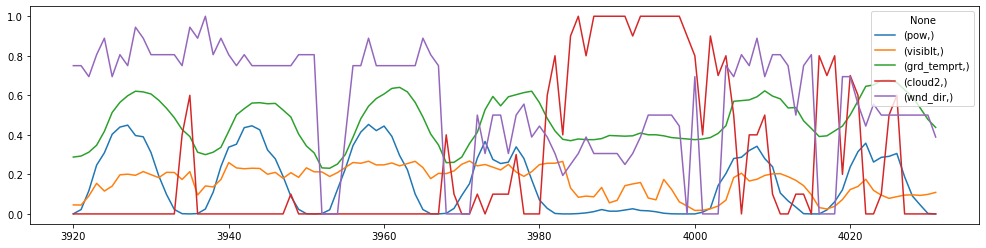

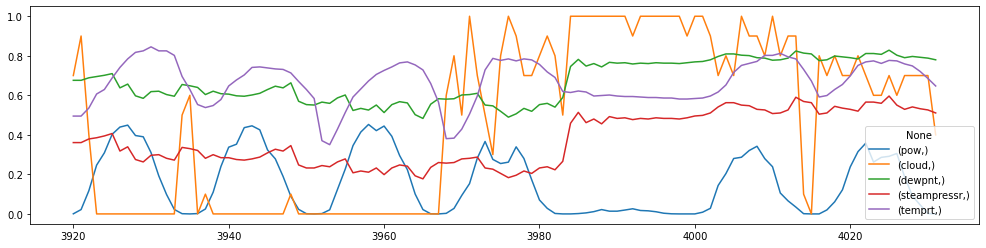

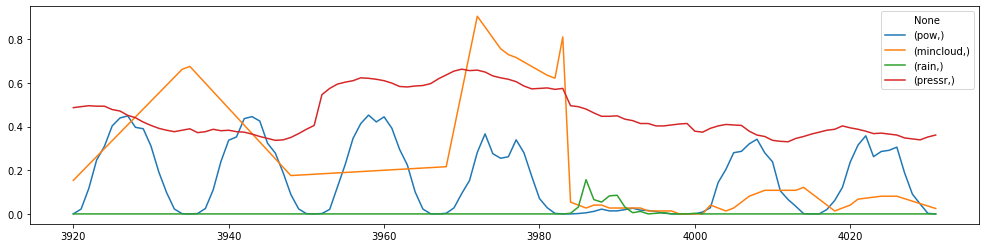

************************************************************************************************************************


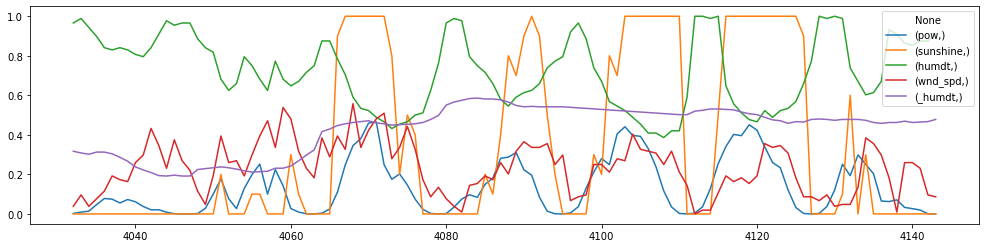

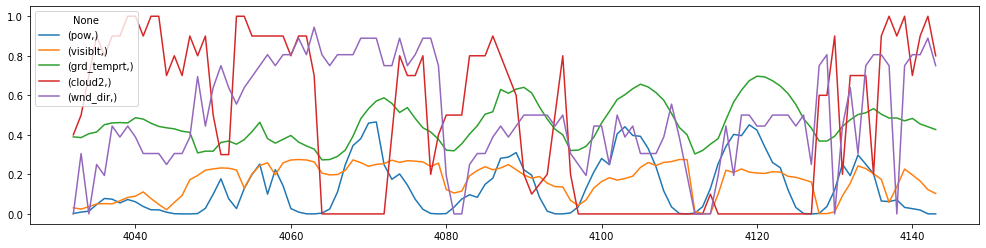

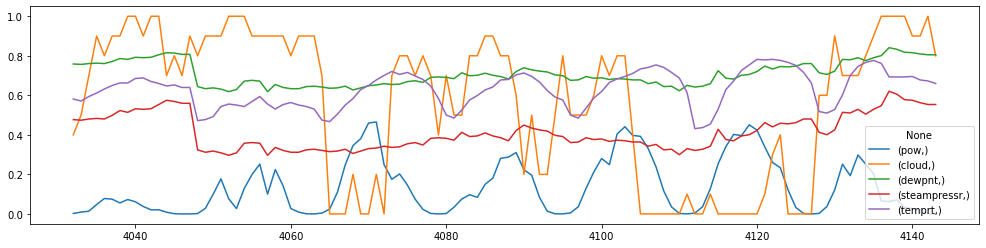

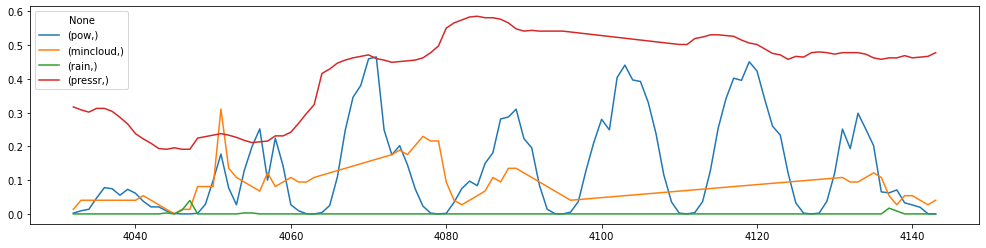

************************************************************************************************************************


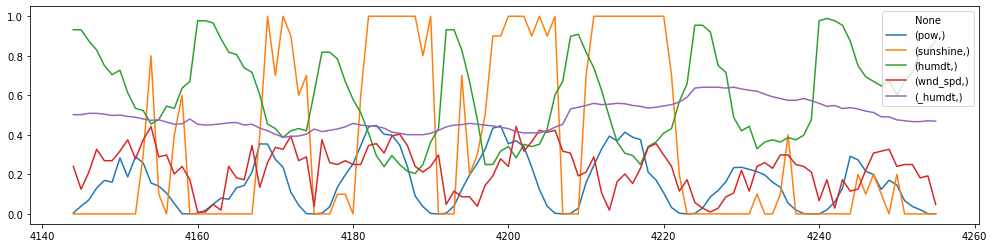

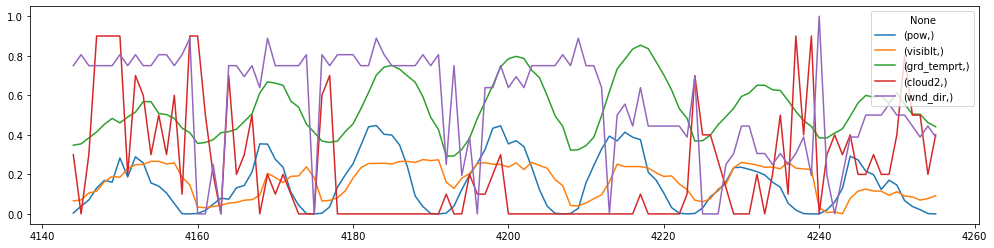

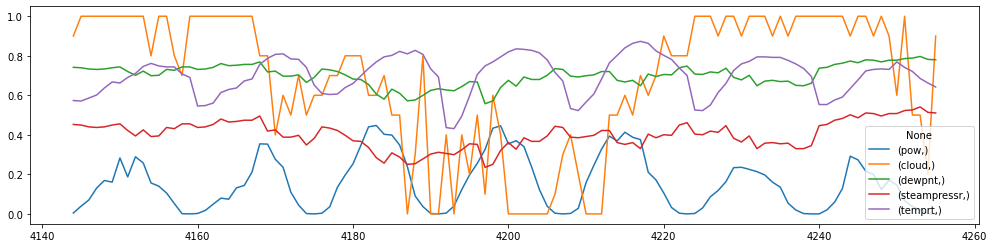

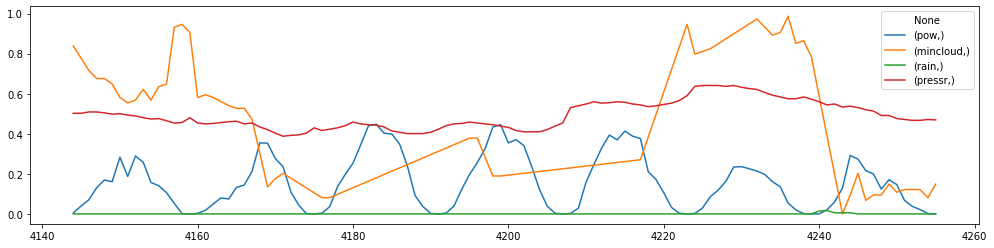

************************************************************************************************************************


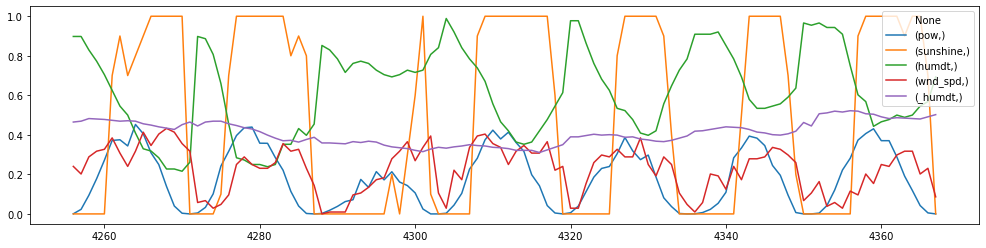

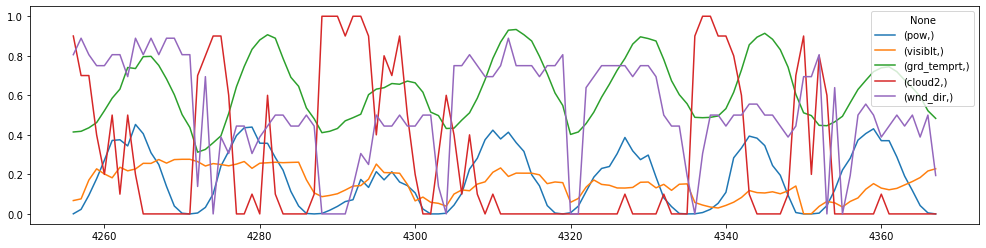

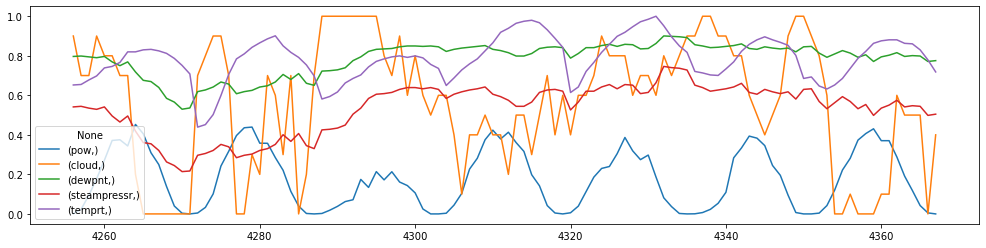

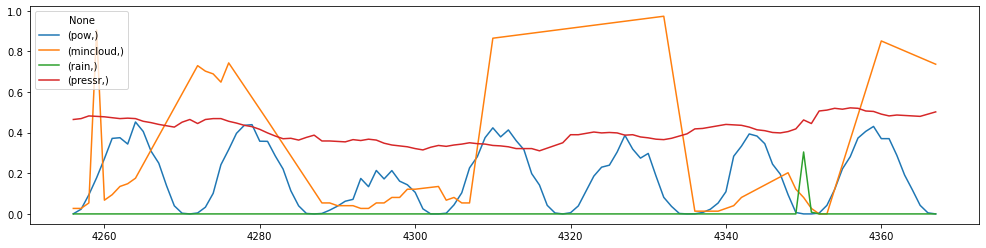

************************************************************************************************************************


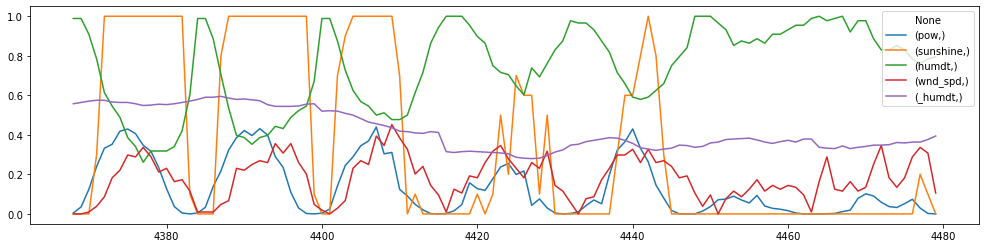

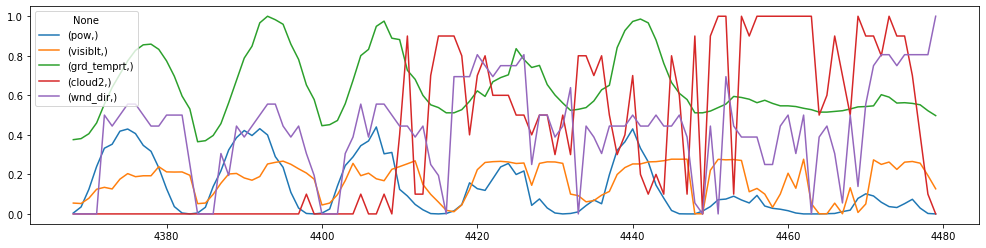

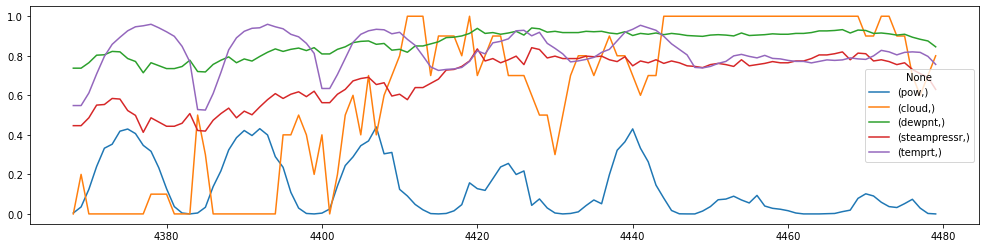

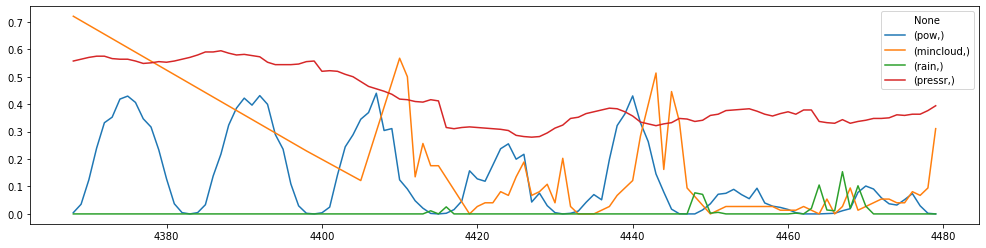

************************************************************************************************************************


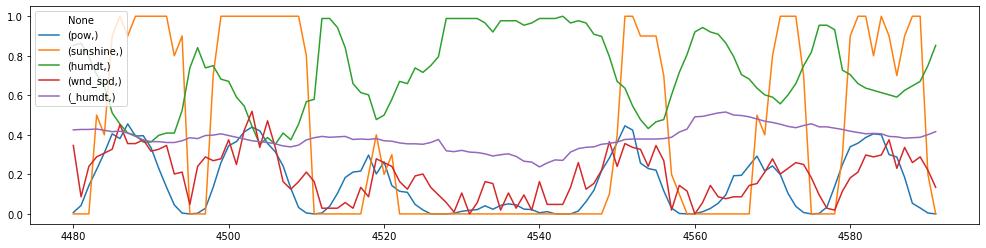

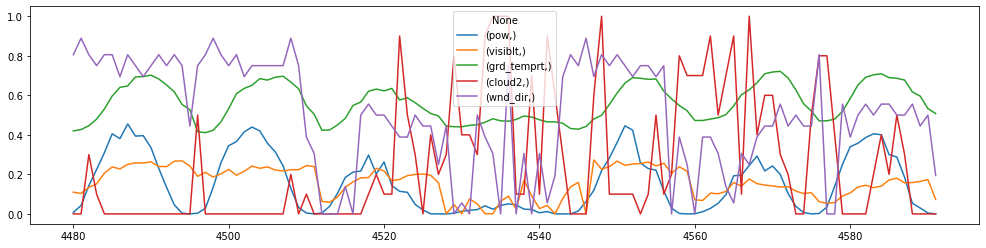

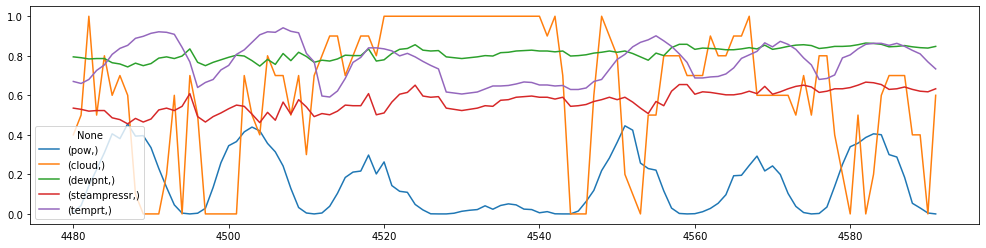

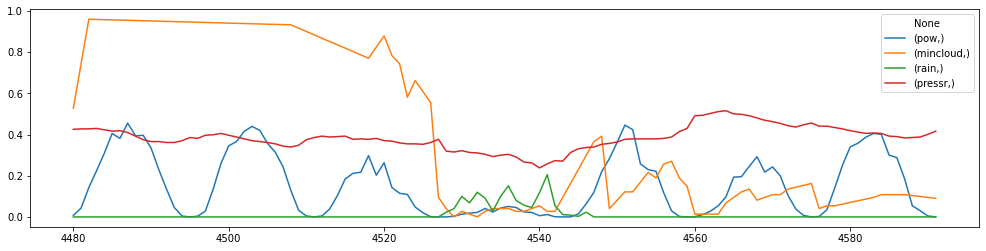

************************************************************************************************************************


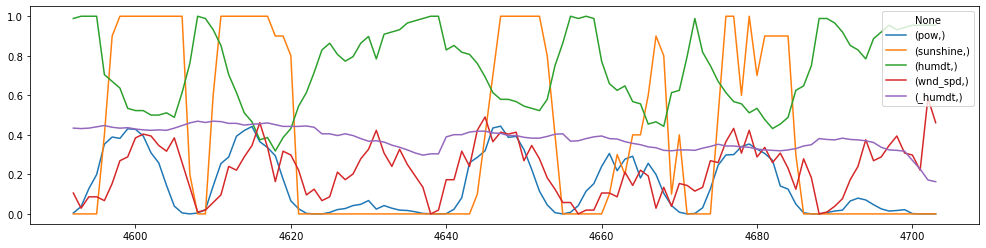

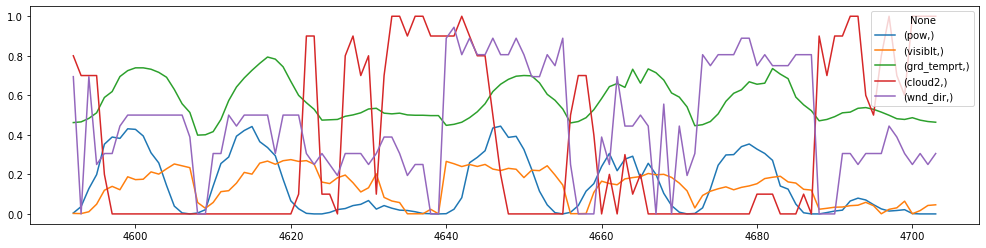

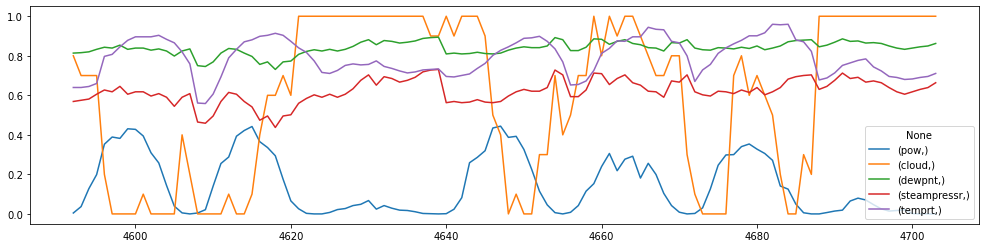

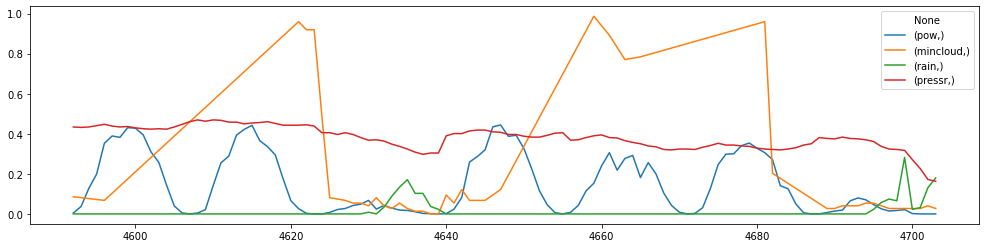

************************************************************************************************************************


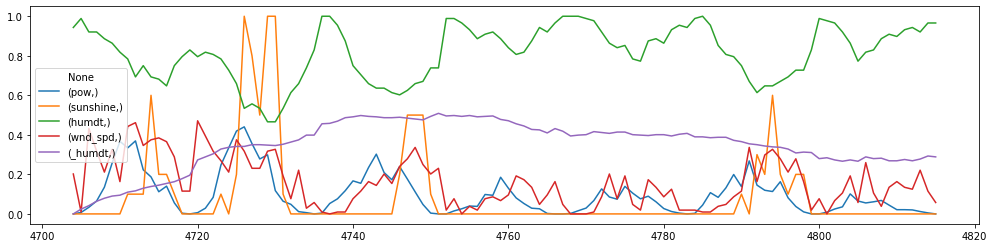

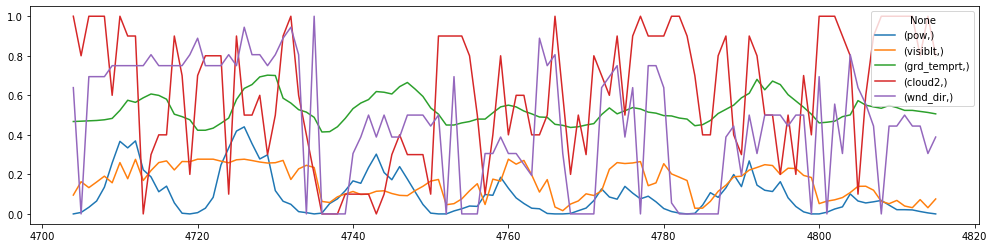

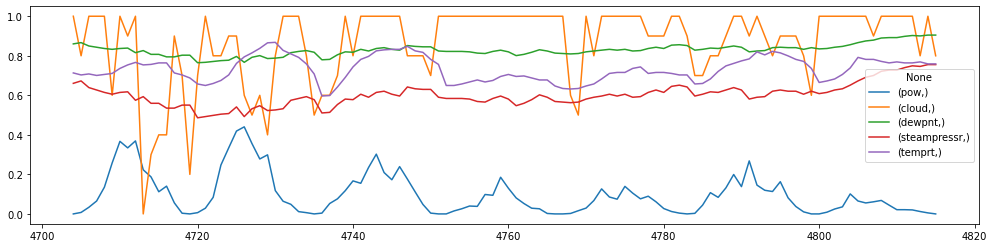

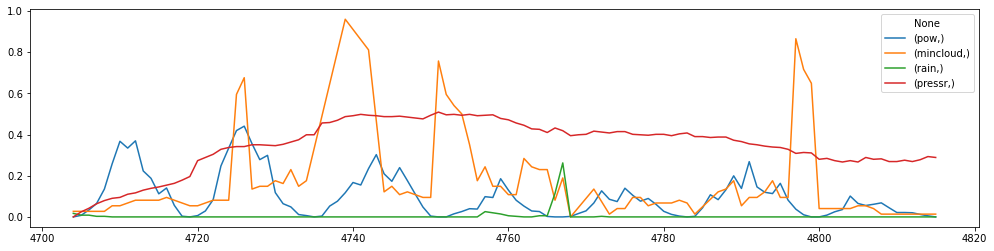

************************************************************************************************************************


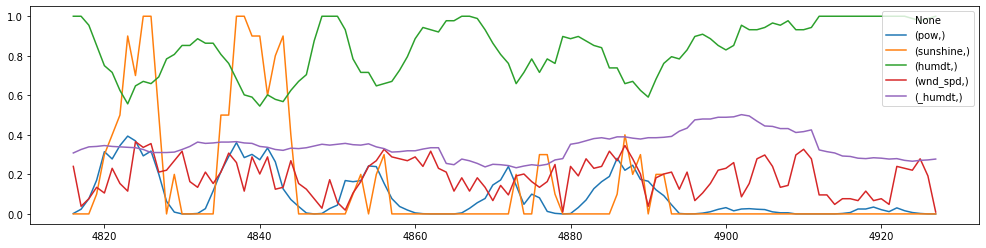

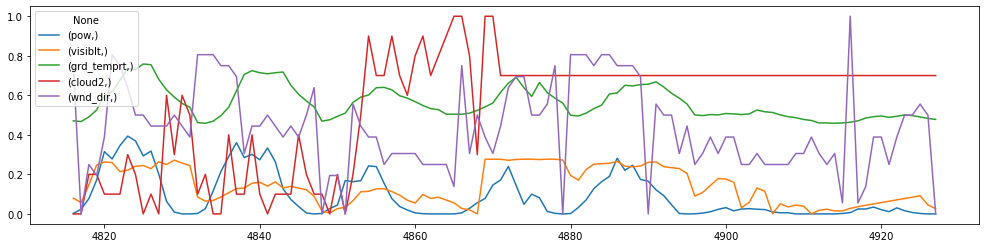

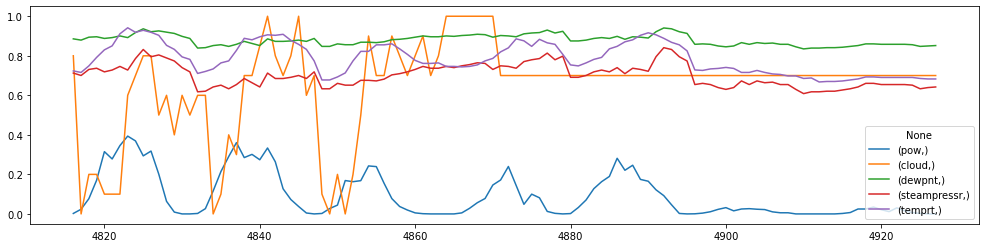

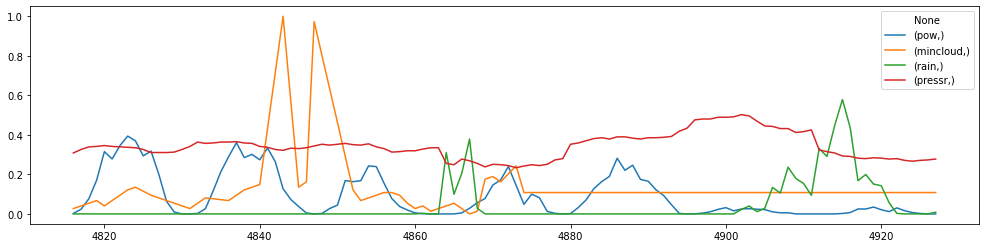

************************************************************************************************************************


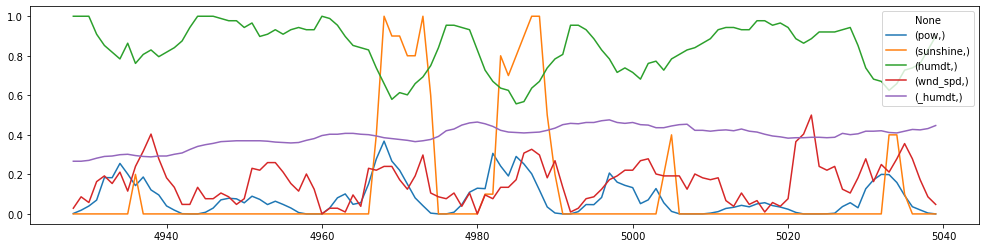

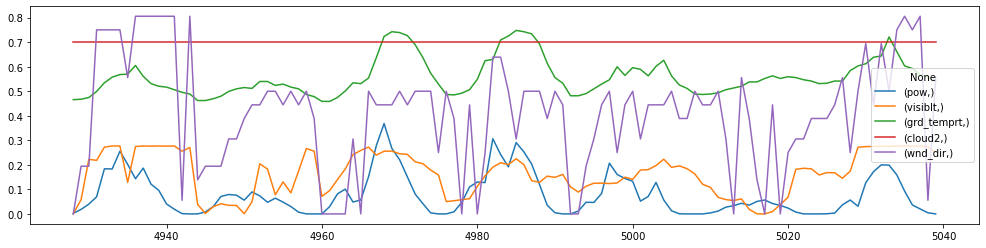

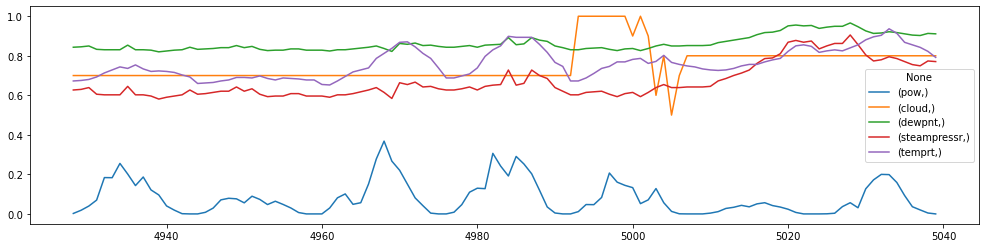

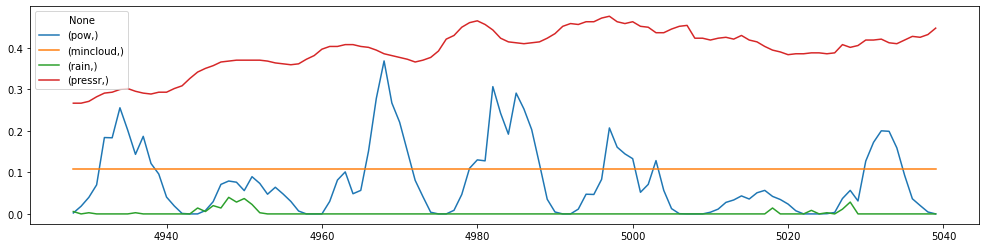

************************************************************************************************************************


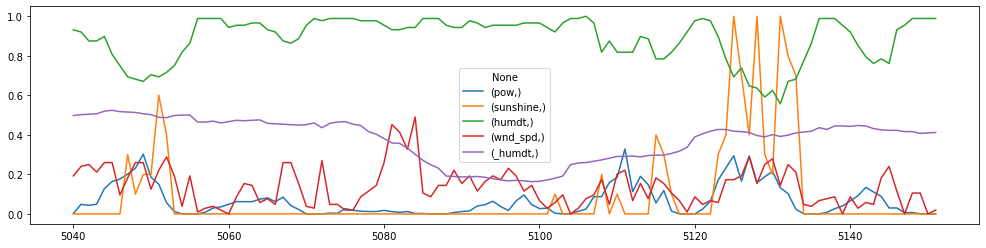

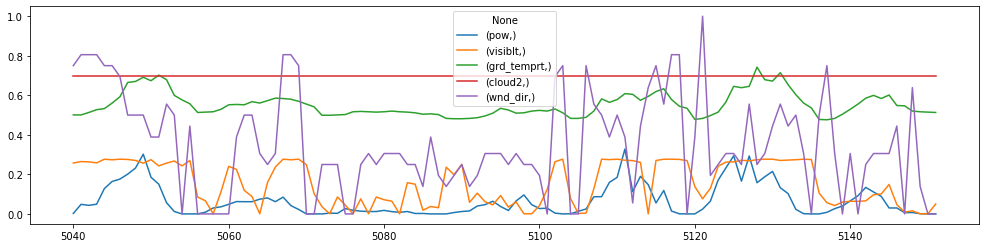

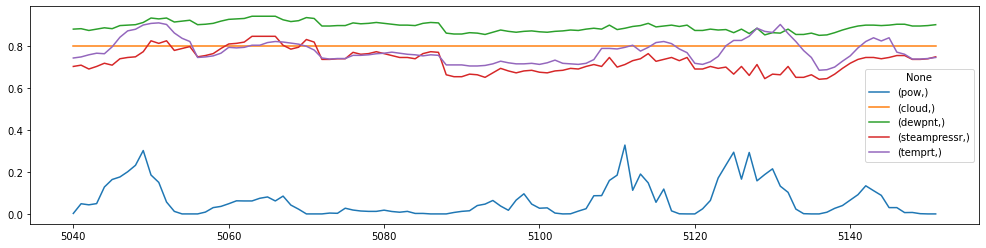

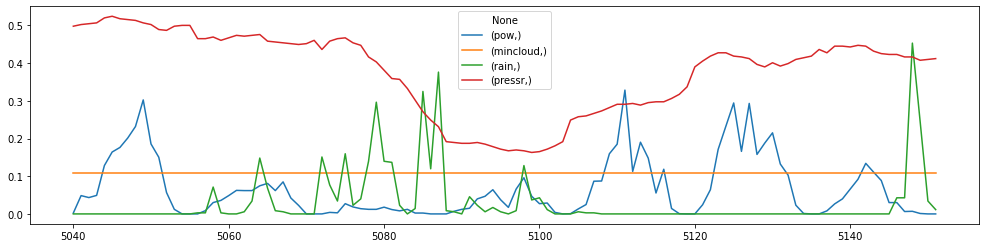

************************************************************************************************************************


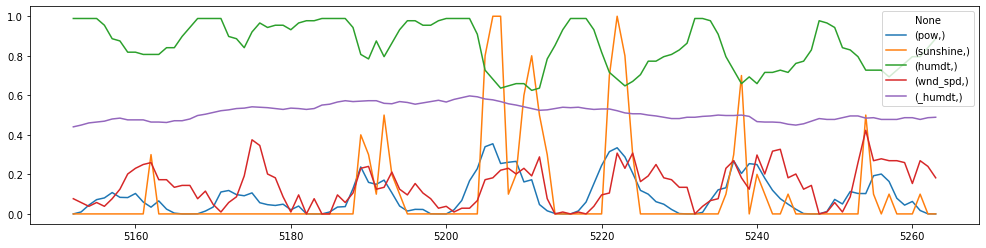

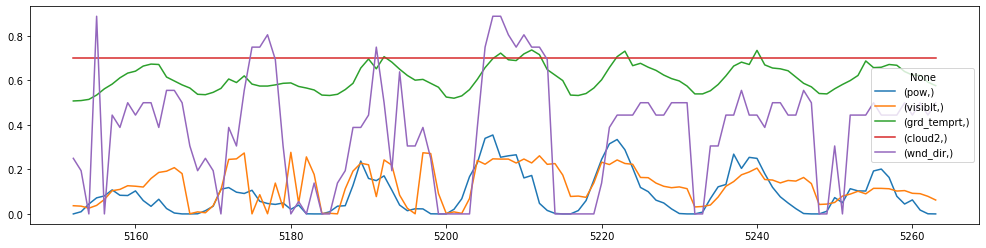

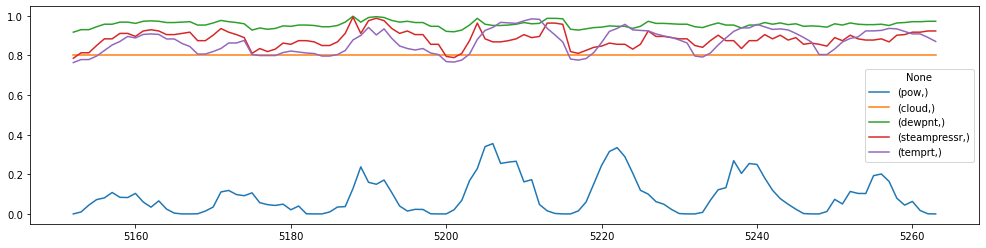

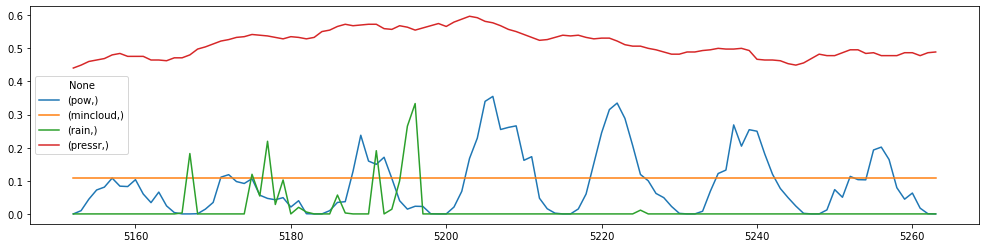

In [5]:
step = hoursteps*7

idx = (int)(np.round(data_dim/4,0))
print("data_dim : ",data_dim, ", idx : ", idx)

plot_dataset1 = dataset_df.iloc[:,:idx]
plot_dataset2 = dataset_df.iloc[:,idx:idx*2]
plot_dataset3 = dataset_df.iloc[:,idx*2:idx*3]
plot_dataset4 = dataset_df.iloc[:,idx*3:]
plot_dataset2.insert(0,'pow',dataset_df.iloc[:,0])
plot_dataset3.insert(0,'pow',dataset_df.iloc[:,0])
plot_dataset4.insert(0,'pow',dataset_df.iloc[:,0])


plot_dataset1.insert(4,'_humdt',dataset_df.iloc[:,dataset_df.shape[1]-1])# 1-hmid(반전용)
#plot_dataset2.insert(5,'tempert2',dataset_df.iloc[:,11])#temp, grd_temp비교용

for i in range(0, plot_dataset1.shape[0]-step, step):
    plt.rcParams["figure.figsize"] = (17,4)
    #plt.plot(dataset_df['pow'], markeredgecolor='r')
    plot_dataset1[i:i+step].plot()
    plot_dataset2[i:i+step].plot()
    plot_dataset3[i:i+step].plot()
    plot_dataset4[i:i+step].plot()
    print("************************************************************************************************************************")
    plt.show()
    

In [7]:
from IPython.display import display_html
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)
    
    
corr = dataset_df.corr(method = 'pearson') 
display(corr.iloc[:,0:1])
#print('\t pearson \t kendall \t spearman')
#display_side_by_side(corr.iloc[:,0:1],corr2.iloc[:,0:1],corr3.iloc[:,0:1])

,pow
pow,1.000000
sunshine,0.687319
humdt,-0.544562
wnd_spd,0.386582
visiblt,0.343840
grd_temprt,0.253527
cloud2,-0.334067
wnd_dir,0.250018
cloud,-0.350742
dewpnt,-0.219610


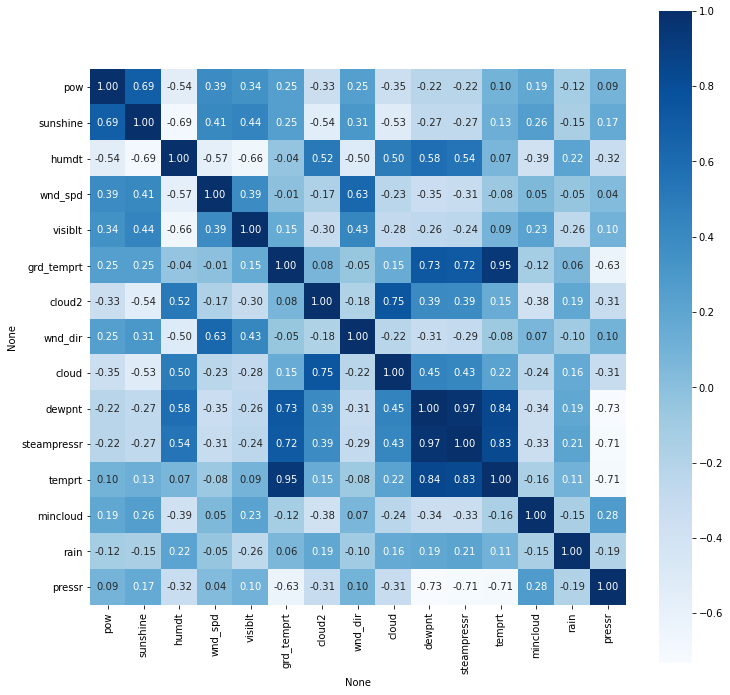

In [8]:
import matplotlib.pyplot as plt 
import seaborn as sns

fig, ax = plt.subplots(figsize=(12,12))  
df_heatmap = sns.heatmap(corr, cbar = True, annot = True, annot_kws={'size' : 10}, fmt = '.2f', square = True, cmap = 'Blues')
